# MA0218 Mini Project 
## - Name: Karthik Ramanathan (U2022855G), Sivakumar Nishaanth (U2021606L)
## - Tutorial: MA9
## - Tutor: Dr Imen Dhief
## - Problem Set: AirBnB

In [1]:
# Basic libraries
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()

In [2]:
# Machine learning libraries

# For plotting real time and interactive maps
import os 
import folium
from folium import plugins
from folium.plugins import FastMarkerCluster 

# For plotting regression model
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

# For plotting Classifcation model
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import plot_tree
from sklearn.metrics import recall_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import export_graphviz
import graphviz

# For NLP
from nltk.corpus import wordnet  #To return the wordnet object value corresponding to the POS tag
import string
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.tokenize import WhitespaceTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer  #To add sentiment anaylsis columns

# Problem 1 
- From Dataset 1 (AirBnB), we will extract the following data `price`, `neighbourhood`, `property_type`, `room_type` and `bed_type`
- Using Regression, we will first analyze if there is any linear relationship between the other variables to the price of room
- We will take that one step further by using multi-variate regression analysis to observe if a combination of these variables affect the prices vastly

In [3]:
# Importing the CSV file
listings = pd.read_csv("listings.csv")
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,f,NaN,WASHINGTON,f,flexible,f,f,1,NaN
4,278830,https://www.airbnb.com/rooms/278830,20160104002432,2016-01-04,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,9.0,f,NaN,WASHINGTON,f,strict,f,f,1,0.89


In [4]:
# To gather the basic information of the dataframe
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 92 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                3818 non-null   int64  
 1   listing_url                       3818 non-null   object 
 2   scrape_id                         3818 non-null   int64  
 3   last_scraped                      3818 non-null   object 
 4   name                              3818 non-null   object 
 5   summary                           3641 non-null   object 
 6   space                             3249 non-null   object 
 7   description                       3818 non-null   object 
 8   experiences_offered               3818 non-null   object 
 9   neighborhood_overview             2786 non-null   object 
 10  notes                             2212 non-null   object 
 11  transit                           2884 non-null   object 
 12  thumbn

In [5]:
# Folium Map Function

# To show the exact location of AirBnB accomaodations

# Create a map using the Map() function and the coordinates for Seattle, WA
map = folium.Map(location=[47.608013, -122.335167], zoomstart =10, prefer_canvas=True)

# Display the map
map

- Plotting points showing all the Airbnb listing with a popup of their price.
- Price will pop-up after click on the point.  
- Zoom function is available for clearer view.  

*Lagging when using the interactive map is inevitable due to the large amount of data in the excel*

In [6]:
locations = listings[['latitude', 'longitude']]
locationlistings = locations.values.tolist()
len(locationlistings)
locationlistings[7]

[47.64016054121466, -122.37585597885769]

In [7]:
my_map = folium.Map(location=[47.608013, -122.335167], zoom_start=12, prefer_canvas=True)
for point in range(0, len(locationlistings)):
    folium.Marker(locationlistings[point], popup=listings['price'][point]).add_to(my_map)
# Printing the map
my_map

## Data Cleaning and Conversion

In [8]:
# Improting only the necessary coloumns
cleanlistings = pd.DataFrame(listings[["neighbourhood_cleansed","property_type","room_type","bed_type"]])
cleanlistings.head()

,neighbourhood_cleansed,property_type,room_type,bed_type
0,West Queen Anne,Apartment,Entire home/apt,Real Bed
1,West Queen Anne,Apartment,Entire home/apt,Real Bed
2,West Queen Anne,House,Entire home/apt,Real Bed
3,West Queen Anne,Apartment,Entire home/apt,Real Bed
4,West Queen Anne,House,Entire home/apt,Real Bed


In [9]:
# Basic information of the dataframe
cleanlistings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   neighbourhood_cleansed  3818 non-null   object
 1   property_type           3817 non-null   object
 2   room_type               3818 non-null   object
 3   bed_type                3818 non-null   object
dtypes: object(4)
memory usage: 119.4+ KB


In [10]:
# Basic Statiscal information of the dataframe
cleanlistings.describe()

,neighbourhood_cleansed,property_type,room_type,bed_type
count,3818,3817,3818,3818
unique,87,16,3,5
top,Broadway,House,Entire home/apt,Real Bed
freq,397,1733,2541,3657


In [11]:
# Conversion of the datatype of the dataframe from `object` to `category`
changedcleanlistings = cleanlistings.astype('category')
changedcleanlistings.dtypes

neighbourhood_cleansed    category
property_type             category
room_type                 category
bed_type                  category
dtype: object

- Next, the `price` variable is extracted out of `listings` (imported to a new datframe)
- The data has to be cleaned before any use. This is due to the presence of spaces and symbols such as '$'. 
- `str.replace()` method is used to perform this

In [12]:
price = pd.DataFrame(listings[["price"]])
price = price["price"].str.replace('$','')
price = price.str.replace(',','')
price.columns = ["price"]
price.head()

<ipython-input-12-1801b3e51483>:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  price = price["price"].str.replace('$','')


0     85.00
1    150.00
2    975.00
3    100.00
4    450.00
Name: price, dtype: object

In [13]:
# Converting the datatype of the dataframe
price.astype('float')

0        85.0
1       150.0
2       975.0
3       100.0
4       450.0
        ...  
3813    359.0
3814     79.0
3815     93.0
3816     99.0
3817     87.0
Name: price, Length: 3818, dtype: float64

Since the `price` is of dataframe type, we will use the `pd.to_numeric()` method to convert the argument to numeric type. Doing so will cause the data within the dataframe to be of `int16` type

In [31]:
price = pd.to_numeric(price['price'], downcast = 'integer')
price = pd.DataFrame(price)
price.head()

,price
0,85
1,150
2,975
3,100
4,450


In [32]:
# To print the basic information of 'Price'
price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   price   3818 non-null   int16
dtypes: int16(1)
memory usage: 7.6 KB


In [35]:
# Next we will concatenate the `price` dataframe with the `changedcleanlistings` dataframe to a single new dataframe.
combine = pd.concat([price,changedcleanlistings], axis = 1)

# If the variable 'property_type' has a null row, return a boolean value of false
airbnbdata = combine[combine["property_type"].isnull() == False]   
airbnbdata.head()

,price,neighbourhood_cleansed,property_type,room_type,bed_type
0,85,West Queen Anne,Apartment,Entire home/apt,Real Bed
1,150,West Queen Anne,Apartment,Entire home/apt,Real Bed
2,975,West Queen Anne,House,Entire home/apt,Real Bed
3,100,West Queen Anne,Apartment,Entire home/apt,Real Bed
4,450,West Queen Anne,House,Entire home/apt,Real Bed


In [36]:
# Basic Information of AirBnB Dataframe
airbnbdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3817 entries, 0 to 3817
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   price                   3817 non-null   int16   
 1   neighbourhood_cleansed  3817 non-null   category
 2   property_type           3817 non-null   category
 3   room_type               3817 non-null   category
 4   bed_type                3817 non-null   category
dtypes: category(4), int16(1)
memory usage: 55.9 KB


In [37]:
# Basic Statiscal Information of AirBnB Dataframe
airbnbdata.describe()

,price
count,3817.000000
mean,127.978255
std,90.261754
min,20.000000
25%,75.000000
50%,100.000000
75%,150.000000
max,1000.000000


## Exploratory Analysis 1

Number of Neighbourhood : 
 Broadway                     397
Belltown                     234
Wallingford                  167
Fremont                      158
Minor                        135
University District          122
Stevens                      119
First Hill                   108
Central Business District    103
Lower Queen Anne              94
Greenwood                     89
East Queen Anne               82
North Beacon Hill             78
Phinney Ridge                 73
Adams                         70
Ravenna                       67
Mann                          67
West Queen Anne               65
West Woodland                 64
Columbia City                 58
Green Lake                    54
North Queen Anne              54
Leschi                        53
Atlantic                      53
Loyal Heights                 52
Mount Baker                   50
North Admiral                 49
Madrona                       47
Eastlake                      45
Seward Park    

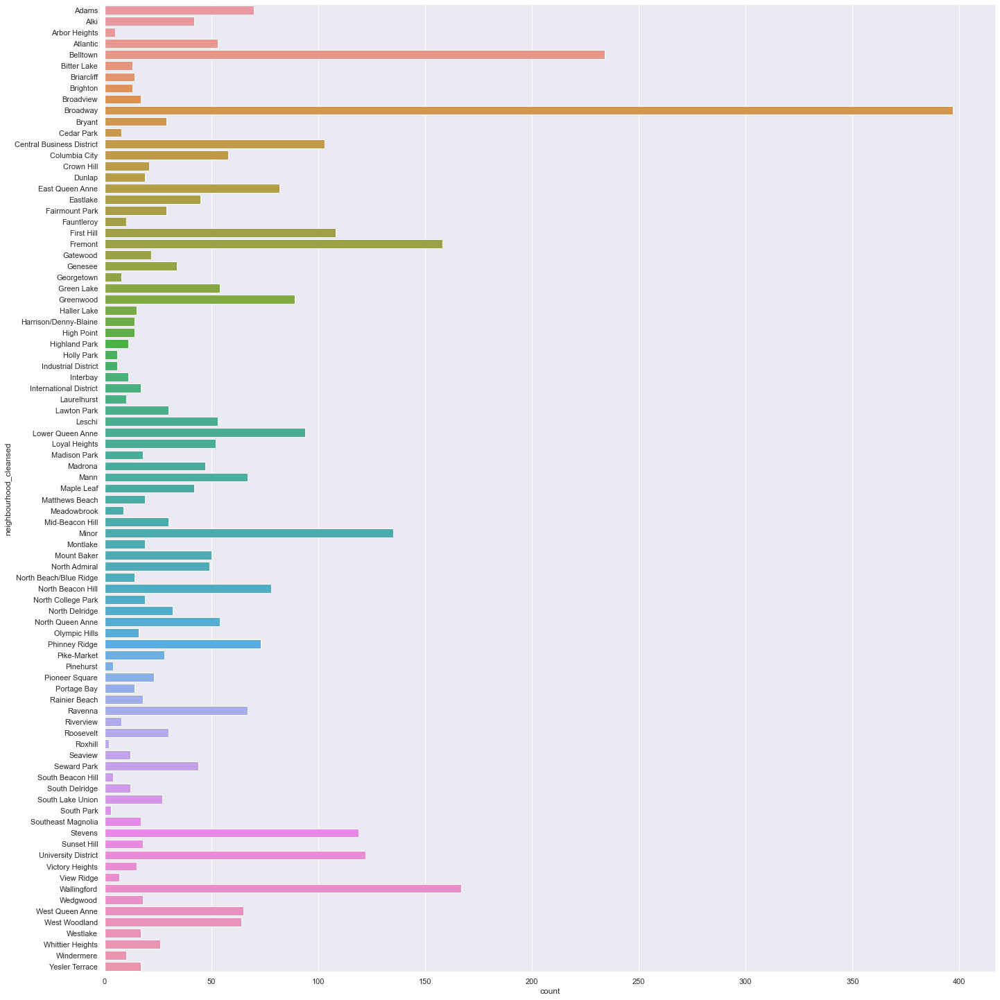

In [38]:
# Catplot of Neighbourhood Cleansed
pd.set_option('display.max_rows', 200)
print("Number of Neighbourhood : \n",(airbnbdata["neighbourhood_cleansed"].value_counts()))
sb.catplot(y = "neighbourhood_cleansed", data = airbnbdata, kind = "count", height = 20)

Number of Property Types : 
 House              1733
Apartment          1708
Townhouse           118
Condominium          91
Loft                 40
Bed & Breakfast      37
Other                22
Cabin                21
Bungalow             13
Camper/RV            13
Boat                  8
Tent                  5
Treehouse             3
Chalet                2
Dorm                  2
Yurt                  1
Name: property_type, dtype: int64


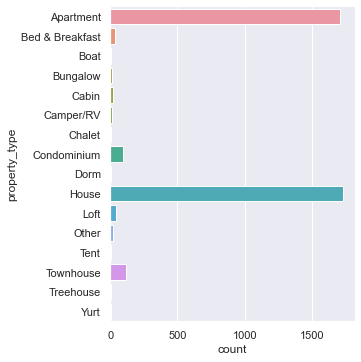

In [39]:
# Catplot of Property types
print("Number of Property Types : \n",(airbnbdata["property_type"].value_counts()))
sb.catplot( data = airbnbdata, y = 'property_type', kind = "count")

Number of Room Types : 
 Entire home/apt    2540
Private room       1160
Shared room         117
Name: room_type, dtype: int64


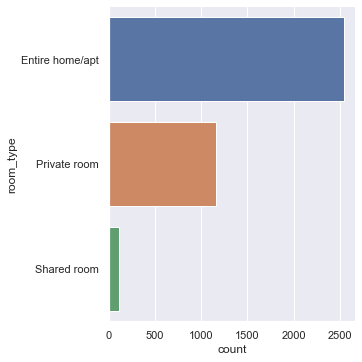

In [40]:
# Catplot of Room types
print("Number of Room Types : \n", (airbnbdata["room_type"].value_counts()))
sb.catplot( data = airbnbdata, y = 'room_type', kind = "count")

Number of Bed Types : 
 Real Bed         3656
Futon              74
Pull-out Sofa      47
Airbed             27
Couch              13
Name: bed_type, dtype: int64


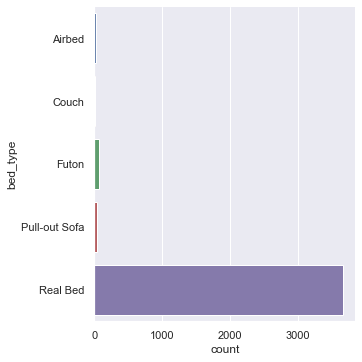

In [41]:
# Catplot of Bed Type
print("Number of Bed Types : \n", (airbnbdata["bed_type"].value_counts()))
sb.catplot( data = airbnbdata, y = 'bed_type', kind = "count")

## Conversion

- Converting all the existing dataframes to a single new dataframe which has only numeric values
- The variables we have chosen is of the categorical type
- As such, we will parse this data into a dictionary type data, so that we can use keys to access specific values. 
- In the case of `neighbourhooddict`, it is for neighbourhood data
- The names of the neighbourhood is encoded into numbers ranging from 1-87
- This is then stored into `neighbourhood` dataframe

In [42]:
neighbourhooddict = airbnbdata.groupby("neighbourhood_cleansed")
Ave_by_neighbourhood = pd.DataFrame(neighbourhooddict["price"].mean())
Ave_by_neighbourhood.columns = ["mean"]
std_by_neighbourhood = neighbourhooddict.std()
std_by_neighbourhood.columns = ["std"]
std_by_neighbourhood.head()
new_frame = pd.concat([Ave_by_neighbourhood,std_by_neighbourhood], axis = 1)
new_frame['neighbourhood']= new_frame.index
new_frame.head()

# Making a new dataframe for the predictor neighbourhoods
Ne_predictor = pd.DataFrame(new_frame["neighbourhood"])

#Converting the names of neighbourhoods into encoded numbers, from 1 to 87
cleanup_names = {"neighbourhood_cleansed": {"Rainier Beach":1, "Olympic Hills":2,"South Delridge":3,"Georgetown":4, "North Delridge":5,"Mid-Beacon Hill":6,"Maple Leaf":7,"Riverview":8,"Victory Heights":9, "Bitter Lake":10, "South Beacon Hill":11, "Highland Park":12, "Crown Hill":13,"Dunlap":14,"Ravenna":15,"North College Park" :16, "South Park":17, "Brighton":18, "Roxhill":19, "University District":20, "Broadview":21,"Columbia City":22, "North Beacon Hill":23, "Mount Baker":24, "Meadowbrook":25, "Greenwood":26, "Haller Lake":27, "High Point":28, "International District":29, "Matthews Beach":30, "Laurelhurst":31, "Seward Park":32, "Loyal Heights":33, "Interbay":34, "Wedgwood":35, "Atlantic":36,"Cedar Park":37, "Bryant":38,"Harrison/Denny-Blaine":39,"Yesler Terrace":40, "Pinehurst":41, "Seaview":42, "Adams":43, "Minor":44,"Genesee":45,"Eastlake":46, "Broadway":47, "Gatewood":48,"West Woodland":49,"Arbor Heights":50, "North Beach/Blue Ridge":51,"Wallingford":52,"Roosevelt":53 , "Whittier Heights":54,"Fairmount Park":55, "Fremont":56, "Phinney Ridge":57,"Madison Park":58,"Mann":59,"Stevens":60,"Leschi":61, "South Lake Union":62,"First Hill":63,"Lower Queen Anne":64,"View Ridge":65, "North Admiral":66, "Holly Park":67, "Lawton Park":68, "Green Lake":69, "North Queen Anne":70,"Pike-Market":71, "Madrona":72, "East Queen Anne":73, "Belltown":74, "Fauntleroy":75, "Central Business District":76, "Pioneer Square":77, "Windermere":78, "Alki":79,"Industrial District":80, "Sunset Hill":81, "Briarcliff":82, "Montlake":83, "West Queen Anne":84, "Westlake":85, "Portage Bay":86, "Southeast Magnolia":87}}
airbnbdata2 = airbnbdata.replace(cleanup_names)
neighbourhood = pd.DataFrame(airbnbdata2["neighbourhood_cleansed"])
neighbourhood.columns = ['neighbourhood']
neighbourhood.head()

,neighbourhood
0,84
1,84
2,84
3,84
4,84


In [43]:
# loop to shows the encoded values in the dictionary
for i in cleanup_names:
    count=1
    for j in cleanup_names[i]:
        print(count,':', format(j))
        count+=1

1 : Rainier Beach
2 : Olympic Hills
3 : South Delridge
4 : Georgetown
5 : North Delridge
6 : Mid-Beacon Hill
7 : Maple Leaf
8 : Riverview
9 : Victory Heights
10 : Bitter Lake
11 : South Beacon Hill
12 : Highland Park
13 : Crown Hill
14 : Dunlap
15 : Ravenna
16 : North College Park
17 : South Park
18 : Brighton
19 : Roxhill
20 : University District
21 : Broadview
22 : Columbia City
23 : North Beacon Hill
24 : Mount Baker
25 : Meadowbrook
26 : Greenwood
27 : Haller Lake
28 : High Point
29 : International District
30 : Matthews Beach
31 : Laurelhurst
32 : Seward Park
33 : Loyal Heights
34 : Interbay
35 : Wedgwood
36 : Atlantic
37 : Cedar Park
38 : Bryant
39 : Harrison/Denny-Blaine
40 : Yesler Terrace
41 : Pinehurst
42 : Seaview
43 : Adams
44 : Minor
45 : Genesee
46 : Eastlake
47 : Broadway
48 : Gatewood
49 : West Woodland
50 : Arbor Heights
51 : North Beach/Blue Ridge
52 : Wallingford
53 : Roosevelt
54 : Whittier Heights
55 : Fairmount Park
56 : Fremont
57 : Phinney Ridge
58 : Madison Par

- Similar to neighbourhood, the property type is encoded into numbers and stored using a dictionary.
- This data is then stored into `propertytype` dataframe

In [44]:
propertytypedict = airbnbdata.groupby("property_type")
avept = pd.DataFrame(propertytypedict["price"].mean())
avept.columns = ["mean"]
stdpt = propertytypedict.std()
stdpt.columns = ["std"]
stdpt.head()
newframe2 = pd.concat([avept,stdpt], axis = 1)
newframe2['property type']= newframe2.index

# Making a new dataframe for the predictor property
ptpred = pd.DataFrame(newframe2["property type"])

#Converting the names of property into encoded numbers, from 1 to 16
clean2 = {"property_type":     {"Dorm":1, "Tent":2,"Other":3,"Chalet":4, "Yurt":5,"Treehouse":6,"Cabin":7,"Bed & Breakfast":8,"Bungalow":9, "Camper/RV":10, "Apartment":11, "Townhouse":12, "House":13,"Loft":14,"Condominium":15,"Boat" :16}} 
airbnbdata3 = airbnbdata.replace(clean2)
propertytype = pd.DataFrame(airbnbdata3["property_type"])
propertytype.columns = ['property_type']
propertytype.head()

,property_type
0,11
1,11
2,13
3,11
4,13


In [45]:
# loop to shows the encoded values in the dictionary
for i in clean2:
    count=1
    for j in clean2[i]:
        print(count,':', format(j))
        count+=1

1 : Dorm
2 : Tent
3 : Other
4 : Chalet
5 : Yurt
6 : Treehouse
7 : Cabin
8 : Bed & Breakfast
9 : Bungalow
10 : Camper/RV
11 : Apartment
12 : Townhouse
13 : House
14 : Loft
15 : Condominium
16 : Boat


- The same logic is applied to room type
- The encoded values from the dictionary is stored into `roomtype` dataframe

In [46]:
roomtypedict = airbnbdata.groupby("room_type")
avert = pd.DataFrame(roomtypedict["price"].mean())
avert.head()
avert.columns = ["mean"]
stdrt = roomtypedict.std()
stdrt.columns = ["std"]
newframe3 = pd.concat([avert,stdrt], axis = 1)
newframe3['room type']= newframe3.index

# Making a new dataframe for the predictor room type
rtpred = pd.DataFrame(newframe3["room type"])

#Converting the names of room type into encoded numbers
clean3 = {"room_type":     {"Shared room":1, "Private room":2,"Entire home/apt":3}}
airbnbdata4 = airbnbdata.replace(clean3)
roomtype = pd.DataFrame(airbnbdata4["room_type"])
roomtype.columns = ['roomtype']
roomtype.head()

,roomtype
0,3
1,3
2,3
3,3
4,3


In [47]:
# loop to shows the encoded values in the dictionary
for i in clean3:
    count=1
    for j in clean3[i]:
        print(count,':', format(j))
        count+=1

1 : Shared room
2 : Private room
3 : Entire home/apt


- The same logic is applied to bed type
- The encoded values from the dictionary is stored into `bedtype` dataframe

In [48]:
bedtypedict = airbnbdata.groupby("bed_type")
avebt = pd.DataFrame(bedtypedict["price"].mean())
avebt.columns = ["mean"]
stdbt = bedtypedict.std()
stdbt.columns = ["std"]
newframe4 = pd.concat([avebt,stdbt], axis = 1)
newframe4['bed type']= newframe4.index

# Making a new dataframe for the predictor bed type
btpred = pd.DataFrame(newframe4["bed type"])

#Converting the names of bed type into encoded numbers
clean4 = {"bed_type":     {"Couch":1,"Futon":2,"Airbed":3,"Pull-out Sofa":4,"Real Bed":5}}
airbnbdata5 = airbnbdata.replace(clean4)
bedtype = pd.DataFrame(airbnbdata5["bed_type"])
bedtype.columns = ['bedtype']
bedtype.head()

,bedtype
0,5
1,5
2,5
3,5
4,5


In [49]:
# loop to shows the encoded values in the dictionary
for i in clean4:
    count=1
    for j in clean4[i]:
        print(count,':', format(j))
        count+=1

1 : Couch
2 : Futon
3 : Airbed
4 : Pull-out Sofa
5 : Real Bed


In [50]:
# Converting all the dataframes to one single dataframe
newairbnbdata = pd.concat([neighbourhood, propertytype, roomtype, bedtype], axis = 1)
newairbnbdata['price'] = price
newairbnbdata.head()

,neighbourhood,property_type,roomtype,bedtype,price
0,84,11,3,5,85
1,84,11,3,5,150
2,84,13,3,5,975
3,84,11,3,5,100
4,84,13,3,5,450


In [51]:
# Basic information of the 'newairbnbdata' dataframe
newairbnbdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3817 entries, 0 to 3817
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   neighbourhood  3817 non-null   int64
 1   property_type  3817 non-null   int64
 2   roomtype       3817 non-null   int64
 3   bedtype        3817 non-null   int64
 4   price          3817 non-null   int16
dtypes: int16(1), int64(4)
memory usage: 285.6 KB


In [52]:
# Basic Statiscal information of the 'newairbnbdata' dataframe
newairbnbdata.describe()

,neighbourhood,property_type,roomtype,bedtype,price
count,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000
mean,49.266964,11.942625,2.634792,4.901755,127.978255
std,21.034195,1.503876,0.541491,0.509901,90.261754
min,1.000000,1.000000,1.000000,1.000000,20.000000
25%,34.000000,11.000000,2.000000,5.000000,75.000000
50%,52.000000,12.000000,3.000000,5.000000,100.000000
75%,64.000000,13.000000,3.000000,5.000000,150.000000
max,87.000000,16.000000,3.000000,5.000000,1000.000000


## Exploratory Analysis 2

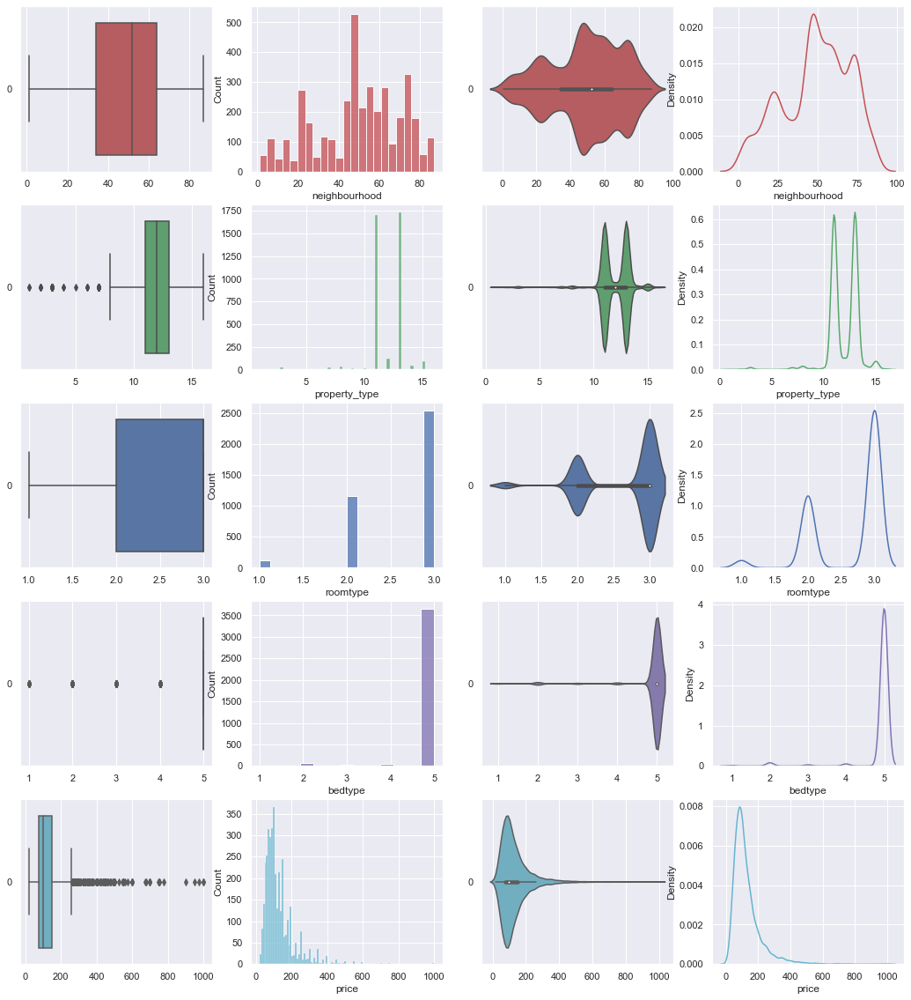

In [53]:
# Draw the distributions of all variables
f, axes = plt.subplots(5, 4, figsize=(18, 20))
colors = ["r", "g", "b", "m", "c"]

count = 0
for var in newairbnbdata:
    sb.boxplot(data = newairbnbdata[var], orient = "h", color = colors[count], ax = axes[count,0])
    sb.histplot(data = newairbnbdata[var], color = colors[count], ax = axes[count,1])
    sb.violinplot(data = newairbnbdata[var], orient = 'h', color = colors[count], ax = axes[count,2])
    sb.kdeplot(data = newairbnbdata[var], color = colors[count], ax = axes[count,3])
    count += 1

In [54]:
# To find the skewness of each variable
newairbnbdata.skew()

neighbourhood   -0.380726
property_type   -2.032234
roomtype        -1.129833
bedtype         -5.531543
price            3.112656
dtype: float64

In [55]:
# Correlation Matrix
newairbnbdata.corr()

,neighbourhood,property_type,roomtype,bedtype,price
neighbourhood,1.000000,-0.094329,0.195224,0.021944,0.295073
property_type,-0.094329,1.000000,-0.116164,0.063387,0.090625
roomtype,0.195224,-0.116164,1.000000,0.215491,0.430129
bedtype,0.021944,0.063387,0.215491,1.000000,0.118743
price,0.295073,0.090625,0.430129,0.118743,1.000000


<AxesSubplot:>

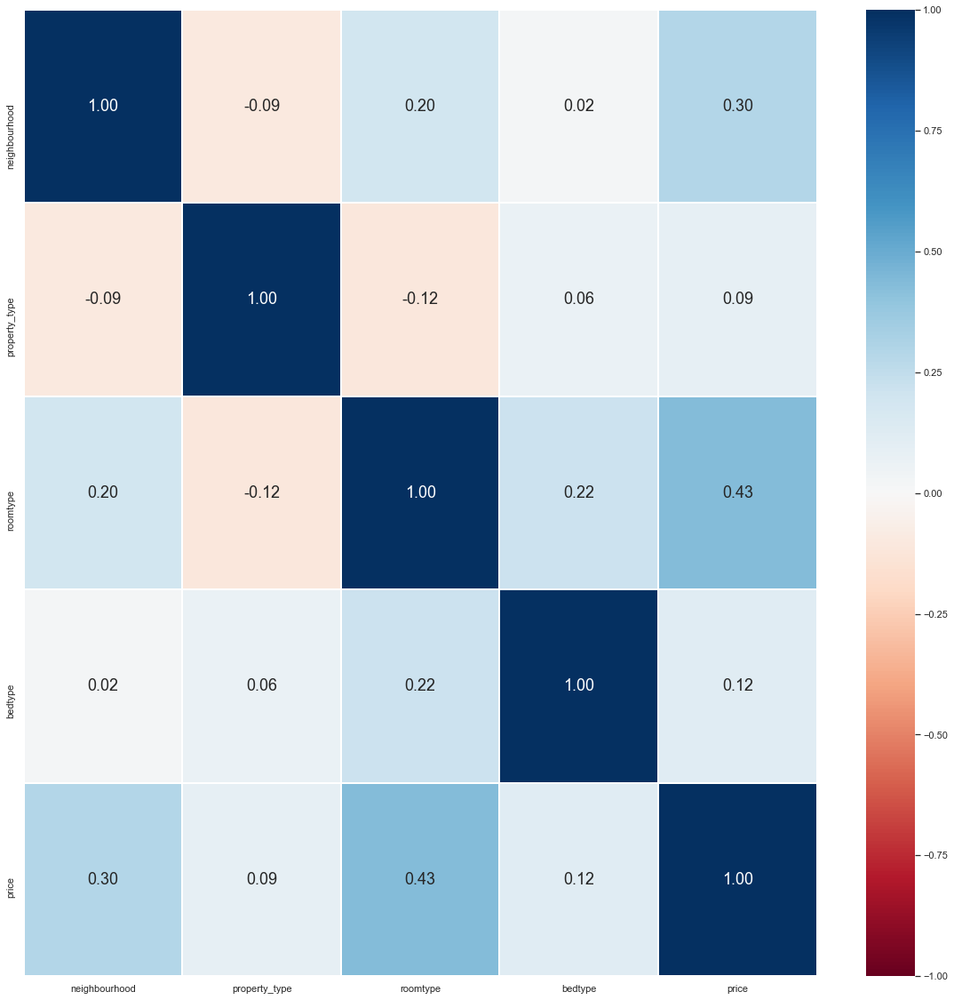

In [56]:
# Heatmap of the Correlation Matrix
f, axes = plt.subplots(1, 1, figsize=(20, 20))
sb.heatmap(newairbnbdata.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

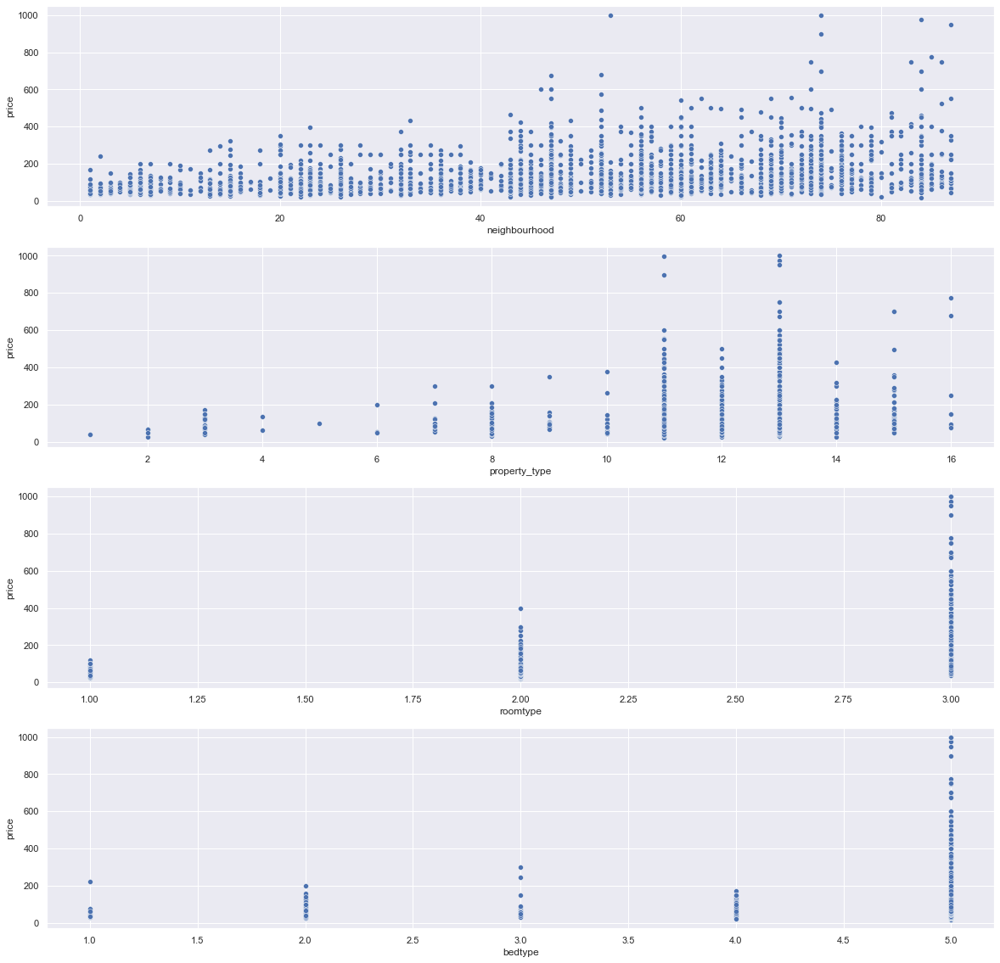

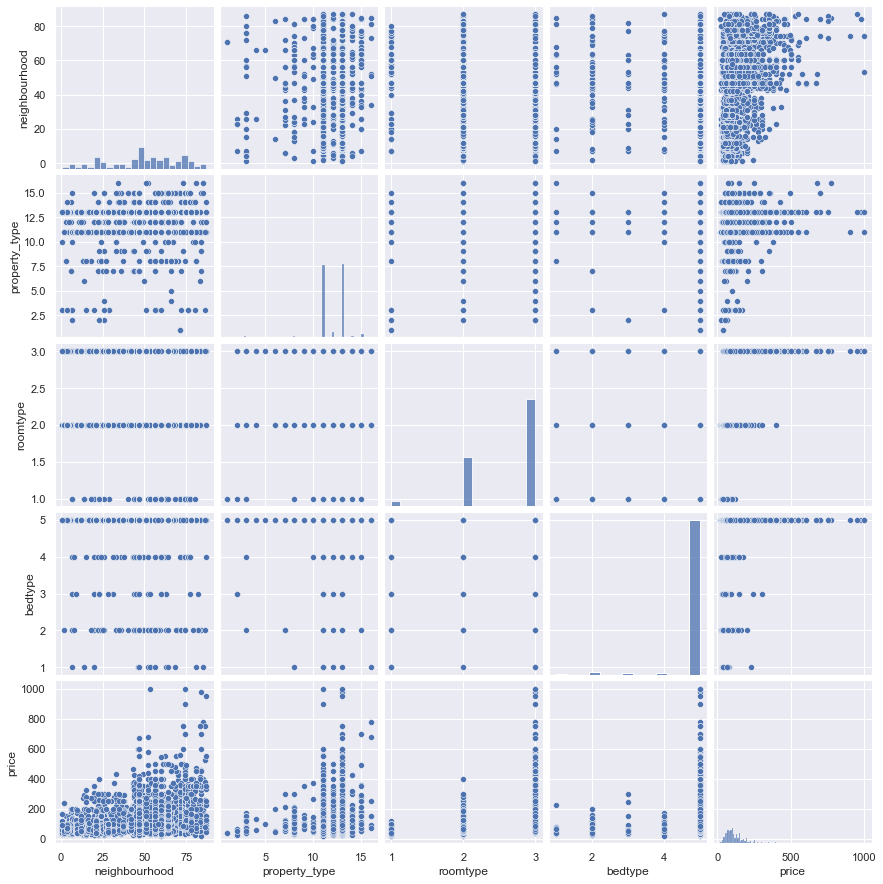

In [57]:
# Draw pairs of variables against one another
f, axes = plt.subplots(len(['neighbourhood', 'property_type', 'roomtype', 'bedtype']), 1, figsize = (20, 20))
count_int = 0
for var in ['neighbourhood', 'property_type', 'roomtype', 'bedtype']:
    sb.scatterplot(x = newairbnbdata[var], 
                   y = newairbnbdata['price'],
                   ax = axes[count_int])
    count_int += 1

# Plotting of pairplot
sb.pairplot(data = newairbnbdata)

- From the pairplot and correlation matrix (heatmap) we can say that roomtype has the strongest relationship with the price. Therefore it's the most useful variable in predicting the price from the variables used above. 

# Problem 2

## Univariate linear regression analysis 1


					Regression model of Neighbourhood against Price

Train Set : (2862, 1) (2862, 1)
Test Set  : (955, 1) (955, 1)
Intercept of Regression 	: b =  [68.24007584]
Coefficients of Regression 	: a =  [[1.21856437]]



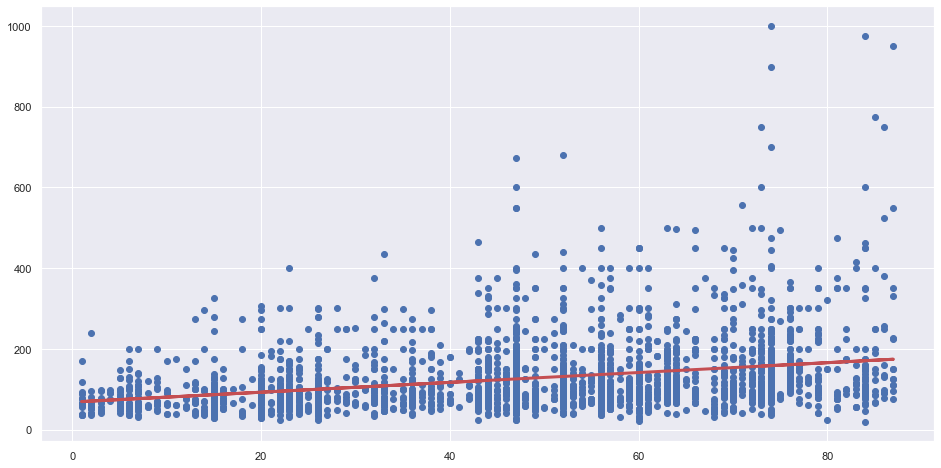

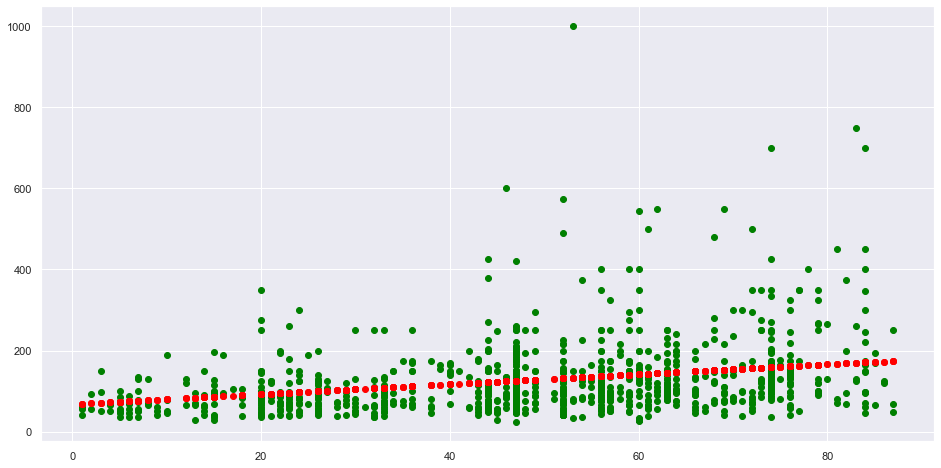

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.08334526354473071
Mean Squared Error (MSE) 	: 7321.239372083971

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.09661445956146586
Mean Squared Error (MSE) 	: 7783.784241777641



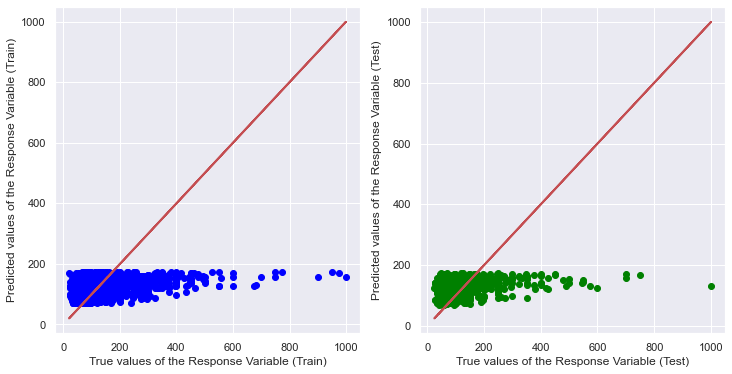

In [58]:
# Univariate Linear Regression for neighbourhood
Y = pd.DataFrame(newairbnbdata['price'])
X1 = pd.DataFrame(newairbnbdata['neighbourhood'])
x_train, x_test, y_train, y_test = train_test_split(X1, Y, test_size = 0.25)
linreg = LinearRegression()         # Create the linear regression object
linreg.fit(x_train, y_train) 

print('\n\t\t\t\t\tRegression model of Neighbourhood against Price\n')
print("Train Set :", y_train.shape, x_train.shape)
print("Test Set  :", y_test.shape, x_test.shape)

print('Intercept of Regression \t: b = ', linreg.intercept_)  # Finding the intercept
print('Coefficients of Regression \t: a = ', linreg.coef_)    # Finding the coefficient
print()

y_train_pred = linreg.predict(x_train)
y_test_pred = linreg.predict(x_test)

# Formula for the Regression line
regline_x = x_train
regline_y = linreg.intercept_ + linreg.coef_ * x_train

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_train, y_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

# Predict Price values corresponding to Neighbourhood
y_test_pred = linreg.predict(x_test)

# Plot the Predictions
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_test, y_test, color = "green")
plt.scatter(x_test, y_test_pred, color = "red")
plt.show()

print("Goodness of Fit of Model \tTrain Dataset")  # Finding the Variance and MSE of the Train Dataset
print("Explained Variance (R^2) \t:", linreg.score(x_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

print("Goodness of Fit of Model \tTest Dataset")   # Finding the Variance and MSE of the Train Dataset
print("Explained Variance (R^2) \t:", linreg.score(x_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 6))
# Train set plot
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 2)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")

# Test set plot
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 2)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()


					Regression model of Property Type against Price

Train Set : (2862, 1) (2862, 1)
Test Set  : (955, 1) (955, 1)
Intercept of Regression 	: b =  [68.57509578]
Coefficients of Regression 	: a =  [[4.91860483]]



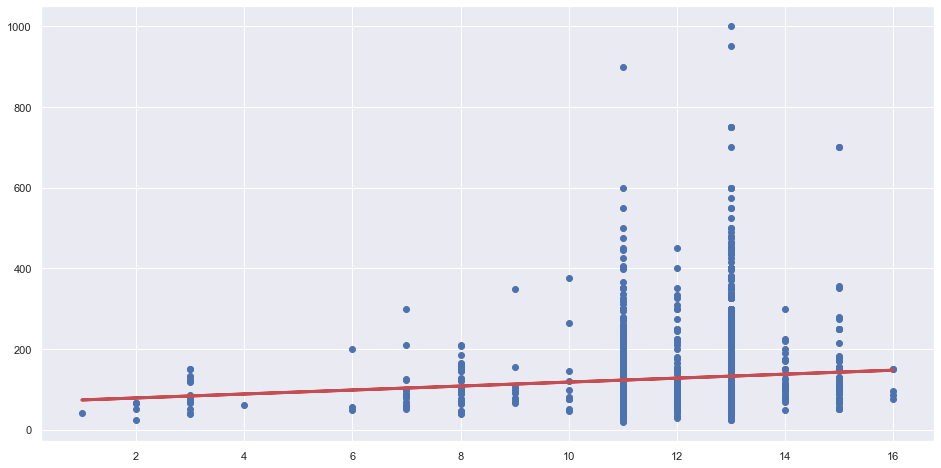

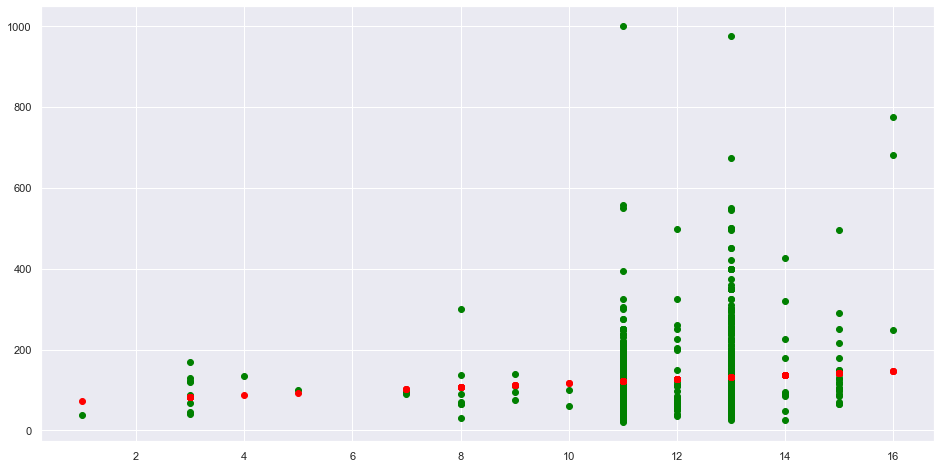

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.0069283624435886315
Mean Squared Error (MSE) 	: 7694.198120414498

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.01039598216565718
Mean Squared Error (MSE) 	: 9233.022311371695



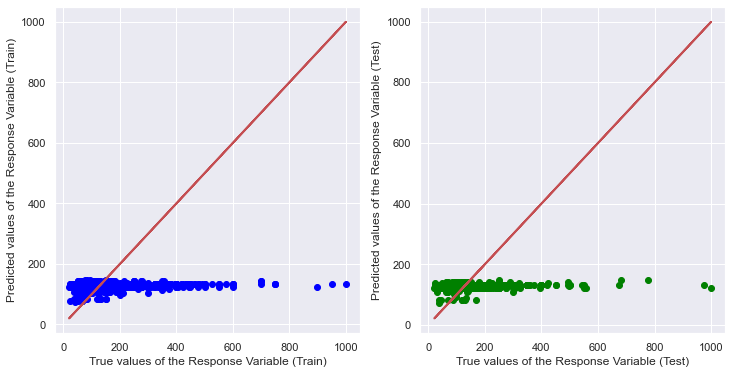

In [59]:
# Univariate Linear Regression for Property type
Y = pd.DataFrame(newairbnbdata['price'])
X2 = pd.DataFrame(newairbnbdata['property_type'])
x_train, x_test, y_train, y_test = train_test_split(X2, Y, test_size = 0.25)
linreg = LinearRegression()         # Create the linear regression object
linreg.fit(x_train, y_train) 

print('\n\t\t\t\t\tRegression model of Property Type against Price\n')
print("Train Set :", y_train.shape, x_train.shape)
print("Test Set  :", y_test.shape, x_test.shape)

print('Intercept of Regression \t: b = ', linreg.intercept_)    # Finding the intercept
print('Coefficients of Regression \t: a = ', linreg.coef_)      # Finding the coefficients
print()

y_train_pred = linreg.predict(x_train)
y_test_pred = linreg.predict(x_test)

# Formula for the Regression line
regline_x = x_train
regline_y = linreg.intercept_ + linreg.coef_ * x_train

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_train, y_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

# Predict Price values corresponding to Property type
y_test_pred = linreg.predict(x_test)

# Plot the Predictions
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_test, y_test, color = "green")
plt.scatter(x_test, y_test_pred, color = "red")
plt.show()

print("Goodness of Fit of Model \tTrain Dataset")      # Finding the Variance and MSE of the Train Dataset
print("Explained Variance (R^2) \t:", linreg.score(x_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

print("Goodness of Fit of Model \tTest Dataset")       # Finding the Variance and MSE of the Train Dataset
print("Explained Variance (R^2) \t:", linreg.score(x_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 6))
# train set plot
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 2)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")

# test set plot
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 2)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()


					Regression model of Room type against Price

Train Set : (2862, 1) (2862, 1)
Test Set  : (955, 1) (955, 1)
Intercept of Regression 	: b =  [-59.10209566]
Coefficients of Regression 	: a =  [[71.05983719]]



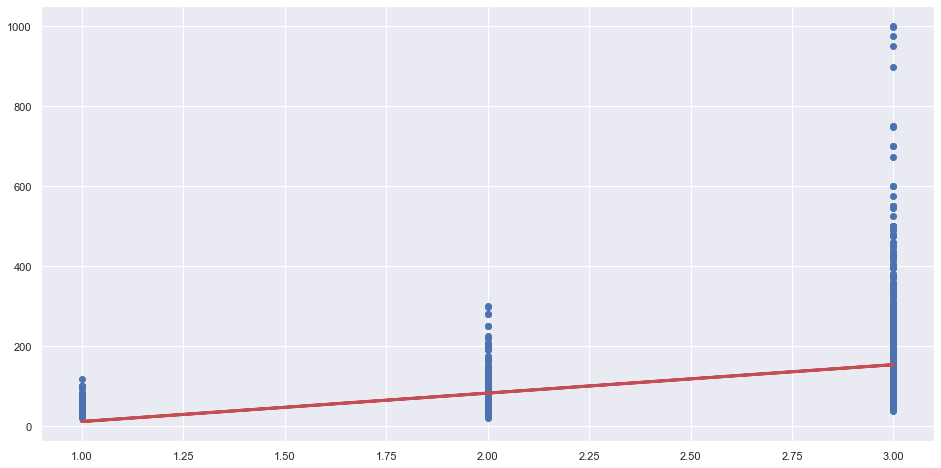

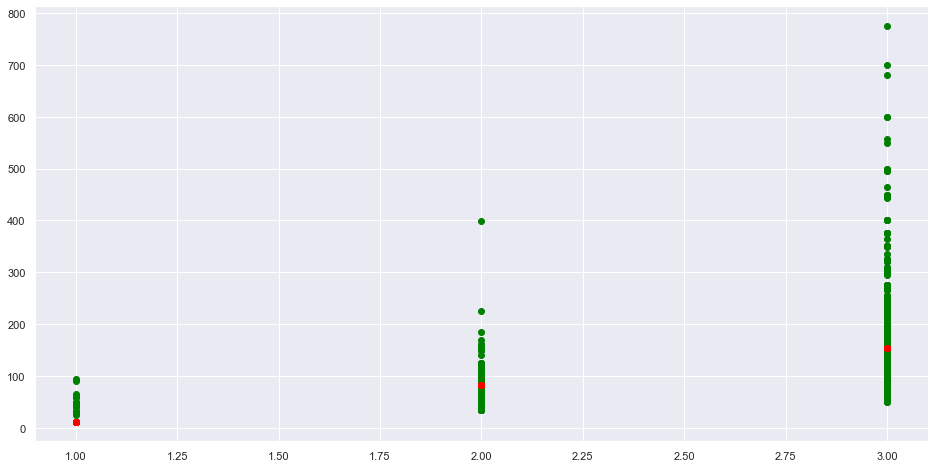

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.18512084078867497
Mean Squared Error (MSE) 	: 6773.8620770660045

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.18396942361067314
Mean Squared Error (MSE) 	: 6231.900489943557



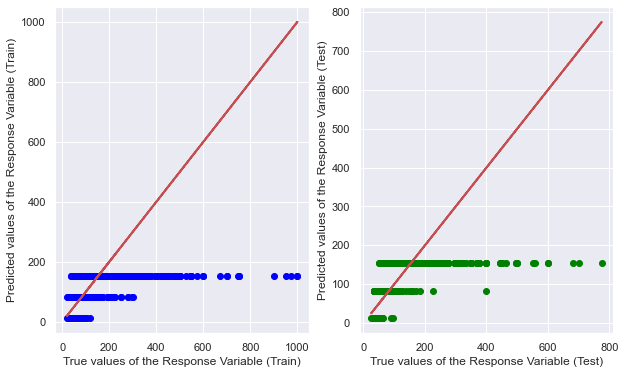

In [62]:
# Univariate Linear Regression for Room type
Y = pd.DataFrame(newairbnbdata['price'])
X3 = pd.DataFrame(newairbnbdata['roomtype'])
x_train, x_test, y_train, y_test = train_test_split(X3, Y, test_size = 0.25)
linreg = LinearRegression()         # Create the linear regression object
linreg.fit(x_train, y_train) 

print('\n\t\t\t\t\tRegression model of Room type against Price\n')
print("Train Set :", y_train.shape, x_train.shape)
print("Test Set  :", y_test.shape, x_test.shape)

print('Intercept of Regression \t: b = ', linreg.intercept_)    # Finding the intercept
print('Coefficients of Regression \t: a = ', linreg.coef_)      # Finding the coefficients
print()

y_train_pred = linreg.predict(x_train)
y_test_pred = linreg.predict(x_test)

# Formula for the Regression line
regline_x = x_train
regline_y = linreg.intercept_ + linreg.coef_ * x_train

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_train, y_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

# Predict Price values corresponding to Room type
y_test_pred = linreg.predict(x_test)

# Plot the Predictions
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_test, y_test, color = "green")
plt.scatter(x_test, y_test_pred, color = "red")
plt.show()

print("Goodness of Fit of Model \tTrain Dataset")       # Finding the Variance and MSE of the Train Dataset
print("Explained Variance (R^2) \t:", linreg.score(x_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

print("Goodness of Fit of Model \tTest Dataset")        # Finding the Variance and MSE of the Train Dataset
print("Explained Variance (R^2) \t:", linreg.score(x_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

f, axes = plt.subplots(1, 2, figsize=(10, 6))
# Train set plot
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 2)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")

# Test set plot
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 2)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()


					Regression model of Bed Type against Price

Train Set : (2862, 1) (2862, 1)
Test Set  : (955, 1) (955, 1)
Intercept of Regression 	: b =  [17.65262638]
Coefficients of Regression 	: a =  [[22.5855286]]



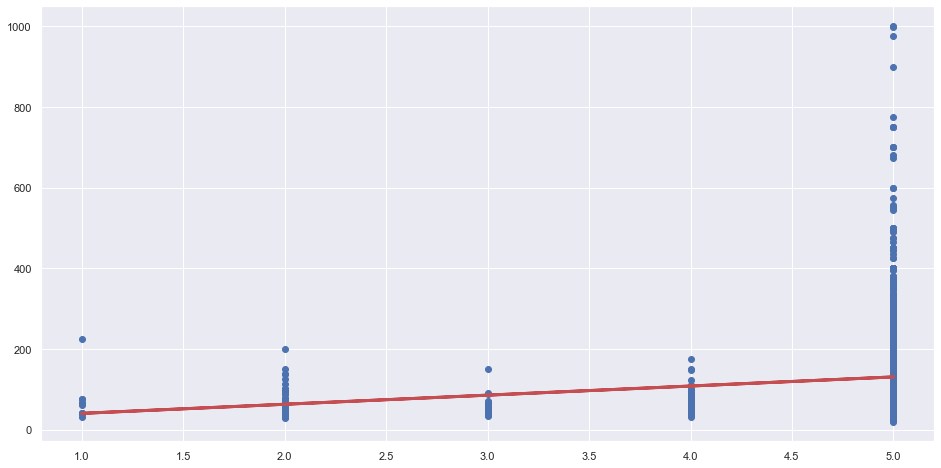

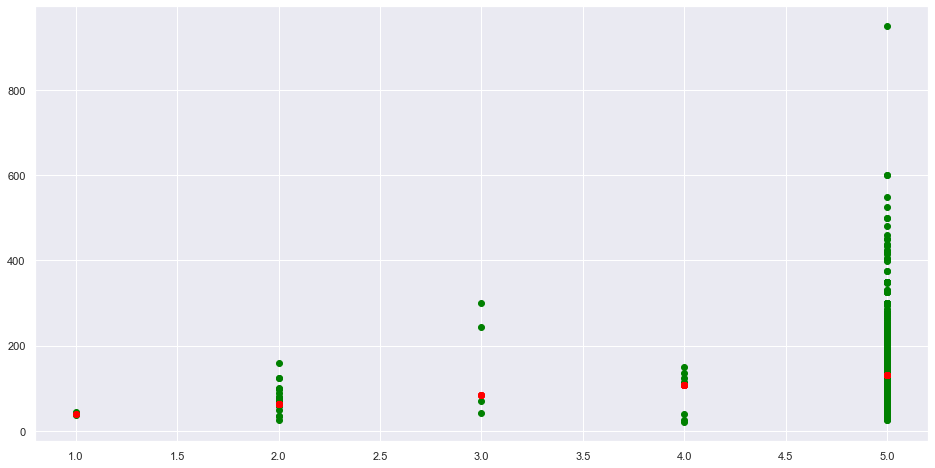

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.016281214322439896
Mean Squared Error (MSE) 	: 8320.047339667004

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.005870642071059806
Mean Squared Error (MSE) 	: 7164.723010571693



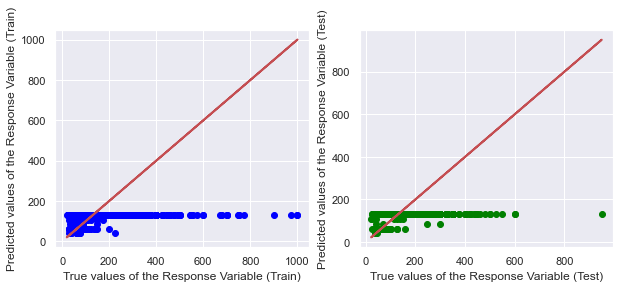

In [61]:
# Univariate Linear Regression for Bed type
Y = pd.DataFrame(newairbnbdata['price'])
X4 = pd.DataFrame(newairbnbdata['bedtype'])
x_train, x_test, y_train, y_test = train_test_split(X4, Y, test_size = 0.25)
linreg = LinearRegression()         # Create the linear regression object
linreg.fit(x_train, y_train) 

print('\n\t\t\t\t\tRegression model of Bed Type against Price\n')
print("Train Set :", y_train.shape, x_train.shape)
print("Test Set  :", y_test.shape, x_test.shape)

print('Intercept of Regression \t: b = ', linreg.intercept_)    # Findig the intercept
print('Coefficients of Regression \t: a = ', linreg.coef_)      # Finding the coefficients
print()

y_train_pred = linreg.predict(x_train)
y_test_pred = linreg.predict(x_test)

# Formula for the Regression line
regline_x = x_train
regline_y = linreg.intercept_ + linreg.coef_ * x_train

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_train, y_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

# Predict Price values corresponding to Bedtype
y_test_pred = linreg.predict(x_test)

# Plot the Predictions
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_test, y_test, color = "green")
plt.scatter(x_test, y_test_pred, color = "red")
plt.show()

print("Goodness of Fit of Model \tTrain Dataset")              # Finding the Variance and MSE of the Train Dataset  
print("Explained Variance (R^2) \t:", linreg.score(x_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

print("Goodness of Fit of Model \tTest Dataset")               # Finding the Variance and MSE of the Train Dataset
print("Explained Variance (R^2) \t:", linreg.score(x_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

f, axes = plt.subplots(1, 2, figsize=(10, 4))
# train set plot
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 2)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")

# test set plot
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 2)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("\n\nPredicted values of the Response Variable (Test)")
plt.show()

The MSE of Roomtype is the lowest among the four variables. Therefore it's the best variable to predict the price.

## Multivariate Linear Regression Analysis 1

Intercept of Regression 	: b =  [-209.77845269]
Coefficients of Regression 	: a =  [[ 0.94653676  9.20083455 64.07892829  2.31992064]]

      Predictors  Coefficients
0  neighbourhood      0.946537
1  property_type      9.200835
2       roomtype     64.078928
3        bedtype      2.319921



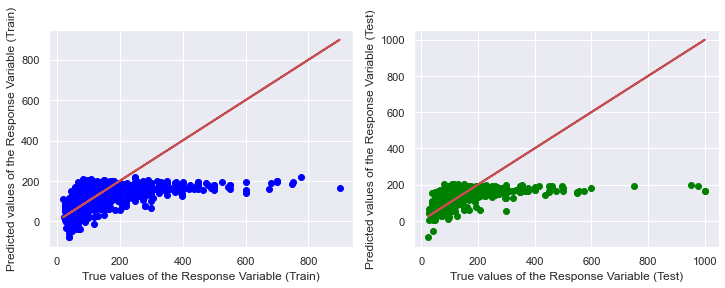

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.2653516712803692
Mean Squared Error (MSE) 	: 5383.611848213954

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.23383259625643316
Mean Squared Error (MSE) 	: 8088.517034486405



In [63]:
# Multi Variate Linear Regression
# Extract Response and Predictors
y = pd.DataFrame(newairbnbdata["price"])
X = pd.DataFrame(newairbnbdata[["neighbourhood", "property_type", "roomtype", "bedtype"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # Create the linear regression object
linreg.fit(X_train, y_train)        # Train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)


# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 2)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 2)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

<ipython-input-64-cb1ab3617233>:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)        # Train the random regression model


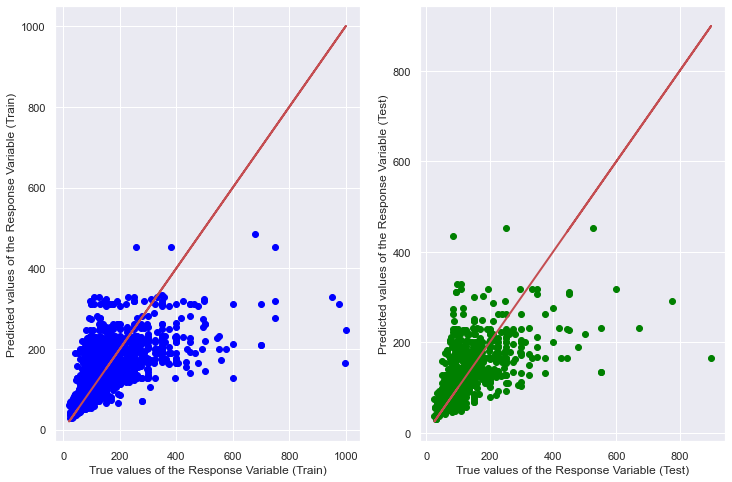

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.43134388616805264
Mean Squared Error (MSE) 	: 4706.852929568247

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.3156059356771054
Mean Squared Error (MSE) 	: 5302.193258592738



In [64]:
# Multivariate Analysis using Random Forest Regressor
# Extract Response and Predictors
y = pd.DataFrame(newairbnbdata["price"])
X = pd.DataFrame(newairbnbdata[["neighbourhood", "property_type", "roomtype", "bedtype"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Random Regression using Train Data
model = RandomForestRegressor()         # Create the random forest regression object
model.fit(X_train, y_train)        # Train the random regression model

# Predict Response corresponding to Predictors
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)


# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 2)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 2)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", model.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", model.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

C:\Users\Nishaanth\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


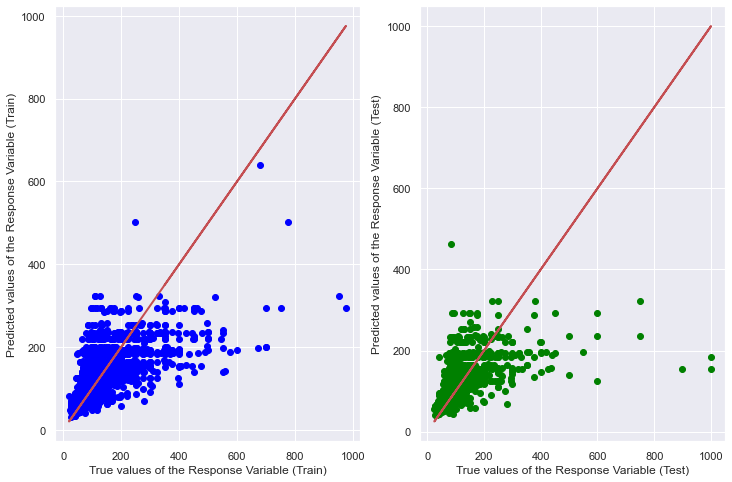

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.4171446769645146
Mean Squared Error (MSE) 	: 4508.441284035242

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.2550023617333146
Mean Squared Error (MSE) 	: 6977.79590828572



In [66]:
# Multivariate Analysis using Gradient Boosting Regressor
# Extract Response and Predictors
y = pd.DataFrame(newairbnbdata["price"])
X = pd.DataFrame(newairbnbdata[["neighbourhood", "property_type", "roomtype", "bedtype"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Random Regression using Train Data
model = GradientBoostingRegressor()         # Create the GradientBoosting regression object
model.fit(X_train, y_train)        # Train the random regression model

# Predict Response corresponding to Predictors
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)


# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 2)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 2)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", model.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", model.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

C:\Users\Nishaanth\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


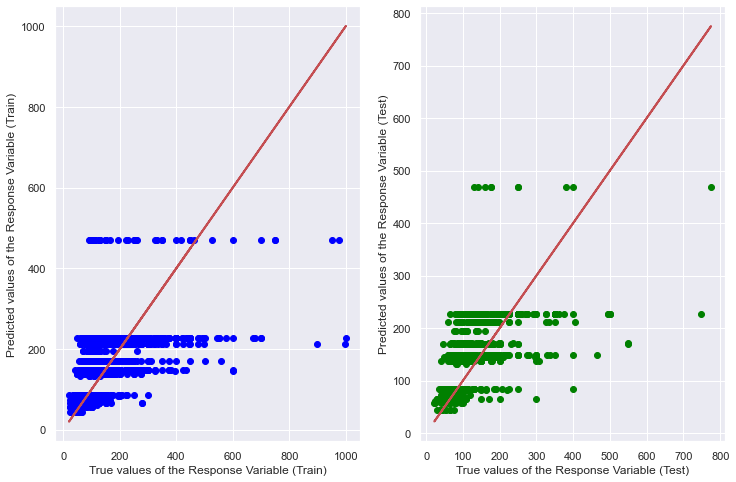

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.2145904205023067
Mean Squared Error (MSE) 	: 6750.595666494807

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.18977663487561447
Mean Squared Error (MSE) 	: 5494.372300167202



In [67]:
# Mutlivariate Analysis using AdaBoost Regressor
# Extract Response and Predictors
y = pd.DataFrame(newairbnbdata["price"])
X = pd.DataFrame(newairbnbdata[["neighbourhood", "property_type", "roomtype", "bedtype"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Random Regression using Train Data
model = AdaBoostRegressor()         # Create the AdaBoost regression object
model.fit(X_train, y_train)        # Train the random regression model

# Predict Response corresponding to Predictors
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)


# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 2)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 2)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", model.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", model.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Problem 3a

- Can we find the relationship between sentiment descriptions and prices.
- Can we use it to predict the price or the rating.

In [68]:
# Continuation from the first imported file.
listings["description"] = listings.description.astype(str)

# Importing Description to a new dataframe
description_df = pd.DataFrame(listings["description"]) 
description_df.head()

,description
0,Make your self at home in this charming one-be...
1,Chemically sensitive? We've removed the irrita...
2,New modern house built in 2013. Spectacular s...
3,A charming apartment that sits atop Queen Anne...
4,Cozy family craftman house in beautiful neighb...


In [70]:
# To categorise words as adjective, noun, adverb, verb
def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

# To clean the text.
def clean_text(text):
    # lower text
    text = text.lower()
    # tokenize text and remove puncutation
    text = [word.strip(string.punctuation) for word in text.split(" ")]
    # remove words that contain numbers
    text = [word for word in text if not any(c.isdigit() for c in word)]
    # remove stop words
    stop = stopwords.words('english')
    text = [x for x in text if x not in stop]
    # remove empty tokens
    text = [t for t in text if len(t) > 0]
    # pos tag text
    pos_tags = pos_tag(text)
    # lemmatize text
    text = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]
    # remove words with only one letter
    text = [t for t in text if len(t) > 1]
    # join all
    text = " ".join(text)
    return(text)

# clean text data
description_df["clean description"] = description_df["description"].apply(lambda x: clean_text(x))
description_df.head()

,description,clean description
0,Make your self at home in this charming one-be...,make self home charm one-bedroom apartment cen...
1,Chemically sensitive? We've removed the irrita...,chemically sensitive we've remove irritant tri...
2,New modern house built in 2013. Spectacular s...,new modern house build spectacular sunset/wate...
3,A charming apartment that sits atop Queen Anne...,charm apartment sits atop queen anne hill nort...
4,Cozy family craftman house in beautiful neighb...,cozy family craftman house beautiful neighborh...


## Sentimental Analysis (Conversion of text into numerical terms)

In [71]:
# Sentimental Analysis for description
sid = SentimentIntensityAnalyzer()
description_df["sentiments"] = description_df["clean description"].apply(lambda x: sid.polarity_scores(x))
description_df = pd.concat([description_df.drop(['sentiments'], axis=1), description_df['sentiments'].apply(pd.Series)], axis=1)
description_df.head()

,description,clean description,neg,neu,pos,compound
0,Make your self at home in this charming one-be...,make self home charm one-bedroom apartment cen...,0.027,0.872,0.102,0.8020
1,Chemically sensitive? We've removed the irrita...,chemically sensitive we've remove irritant tri...,0.043,0.573,0.385,0.9941
2,New modern house built in 2013. Spectacular s...,new modern house build spectacular sunset/wate...,0.000,0.829,0.171,0.9638
3,A charming apartment that sits atop Queen Anne...,charm apartment sits atop queen anne hill nort...,0.000,0.743,0.257,0.8074
4,Cozy family craftman house in beautiful neighb...,cozy family craftman house beautiful neighborh...,0.021,0.808,0.171,0.9638


In [72]:
# Creating a new dataframe
sentiment_value = pd.DataFrame(description_df["compound"])

# Need to convert sentiment value to int form
sentiment_value["compound1"] = sentiment_value["compound"].apply(lambda x: x * 10000)
sentiment_value["compound_description"]= sentiment_value["compound1"].astype(int)
sentiment_value.head()

,compound,compound1,compound_description
0,0.8020,8020.0,8020
1,0.9941,9941.0,9941
2,0.9638,9638.0,9638
3,0.8074,8074.0,8074
4,0.9638,9638.0,9638


In [74]:
# Importing a new predictor variable called notes to a new dataframe
notes_df = pd.DataFrame(listings["notes"])
notes_df["notes"] = notes_df.notes.astype(str)
notes_df["clean notes"] = notes_df["notes"].apply(lambda x: clean_text(x))

# Sentimental Analysis for notes
sid = SentimentIntensityAnalyzer()
notes_df["sentiments"] = notes_df["clean notes"].apply(lambda x: sid.polarity_scores(x))
notes_df = pd.concat([notes_df.drop(['sentiments'], axis=1), notes_df['sentiments'].apply(pd.Series)], axis=1)

# Creating a new dataframes
sentiment_value_notes = pd.DataFrame(notes_df["compound"])

# need to convert sentiment value to int form
sentiment_value_notes["compound1"] = sentiment_value_notes["compound"].apply(lambda x: x * 10000)
sentiment_value_notes["compound_notes"]= sentiment_value_notes["compound1"].astype(int)
sentiment_value_notes.head()

,compound,compound1,compound_notes
0,0.0000,0.0,0
1,0.9612,9612.0,9612
2,-0.6124,-6124.0,-6124
3,0.0000,0.0,0
4,0.0000,0.0,0


In [76]:
# Importing a new predictor variable called summary to a new dataframe
summary_df = pd.DataFrame(listings["summary"])
summary_df["summary"] = summary_df.summary.astype(str)
summary_df["clean summary"] = summary_df["summary"].apply(lambda x: clean_text(x))

# Sentimental Analysis for Summary
sid = SentimentIntensityAnalyzer()
summary_df["sentiments"] = summary_df["clean summary"].apply(lambda x: sid.polarity_scores(x))
summary_df = pd.concat([summary_df.drop(['sentiments'], axis=1), summary_df['sentiments'].apply(pd.Series)], axis=1)

# Creating a new dataframes
sentiment_value_summary = pd.DataFrame(summary_df["compound"])

# Need to convert sentiment value to int form
sentiment_value_summary["compound1"] = sentiment_value_summary["compound"].apply(lambda x: x * 10000)
sentiment_value_summary["compound_summary"]= sentiment_value_summary["compound1"].astype(int)
sentiment_value_summary.head()

,compound,compound1,compound_summary
0,0.0000,0.0,0
1,0.1779,1779.0,1779
2,0.7425,7425.0,7425
3,0.8074,8074.0,8074
4,0.8225,8225.0,8225


In [77]:
# Importing a new predictor variable called space to a new dataframe
space_df = pd.DataFrame(listings["space"])
space_df["space"] = space_df.space.astype(str)
space_df["clean space"] = space_df["space"].apply(lambda x: clean_text(x))

# Sentimental Analysis for Summary
sid = SentimentIntensityAnalyzer()
space_df["sentiments"] = space_df["clean space"].apply(lambda x: sid.polarity_scores(x))
space_df = pd.concat([space_df.drop(['sentiments'], axis=1), space_df['sentiments'].apply(pd.Series)], axis=1)

# Creating a new dataframes
sentiment_value_space = pd.DataFrame(space_df["compound"])

# need to convert sentiment value to int form
sentiment_value_space["compound1"] = sentiment_value_space["compound"].apply(lambda x: x * 10000)
sentiment_value_space["compound_space"]= sentiment_value_space["compound1"].astype(int)
sentiment_value_space.head()

,compound,compound1,compound_space
0,0.8020,8020.0,8020
1,0.9959,9959.0,9959
2,0.9287,9287.0,9287
3,0.0000,0.0,0
4,0.8885,8885.0,8885


In [78]:
# Adding all the 4 dataframes created to a single new dataframe
total_compound = pd.DataFrame(sentiment_value['compound_description'])
total_compound['compound_notes'] = pd.DataFrame(sentiment_value_notes['compound_notes'])
total_compound['compound_summary'] = pd.DataFrame(sentiment_value_summary['compound_summary'])
total_compound['compound_space'] = pd.DataFrame(sentiment_value_space['compound_space'])

# Adding the price that we created in Problem 1 and 2 this dataframe
total_compound['price'] = pd.DataFrame(price['price'])


total_compound.head()

,compound_description,compound_notes,compound_summary,compound_space,price
0,8020,0,0,8020,85
1,9941,9612,1779,9959,150
2,9638,-6124,7425,9287,975
3,8074,0,8074,0,100
4,9638,0,8225,8885,450


In [79]:
# Basic information of the dataframe
total_compound.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   compound_description  3818 non-null   int32
 1   compound_notes        3818 non-null   int32
 2   compound_summary      3818 non-null   int32
 3   compound_space        3818 non-null   int32
 4   price                 3818 non-null   int16
dtypes: int16(1), int32(4)
memory usage: 67.2 KB


In [80]:
# Basic Statiscal description information of the dataframe
total_compound.describe()

,compound_description,compound_notes,compound_summary,compound_space,price
count,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000
mean,8568.796752,2822.835254,5532.744369,6241.381613,127.976166
std,2648.692207,3866.466636,3806.511012,4078.663764,90.250022
min,-9618.000000,-8979.000000,-8271.000000,-9001.000000,20.000000
25%,8753.250000,0.000000,3400.000000,2809.750000,75.000000
50%,9580.000000,0.000000,6908.000000,8338.000000,100.000000
75%,9808.000000,6705.000000,8555.000000,9571.000000,150.000000
max,9974.000000,9960.000000,9922.000000,9964.000000,1000.000000


## Exploratory Analysis 3

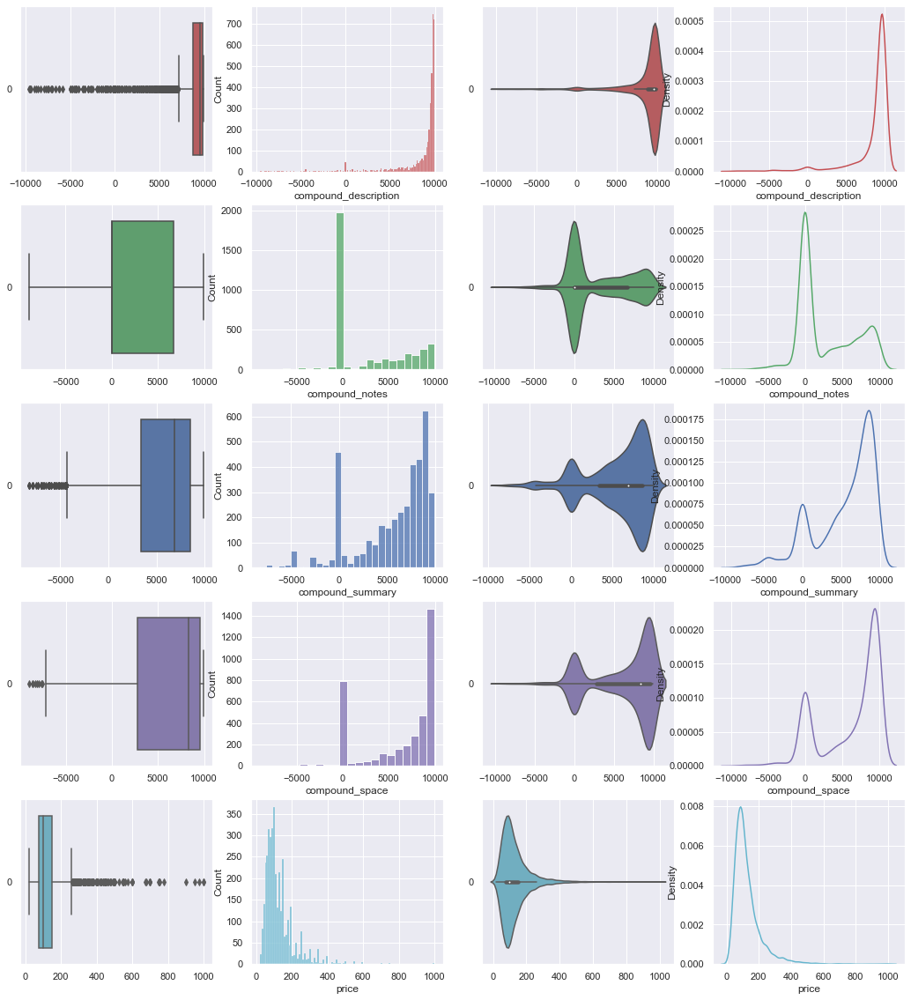

In [82]:
# Draw the distributions of all variables
f, axes = plt.subplots(5, 4, figsize=(18, 20))
colors = ["r", "g", "b", "m", "c"]

count = 0
for var in total_compound:
    sb.boxplot(data = total_compound[var], orient = "h", color = colors[count], ax = axes[count,0])
    sb.histplot(data = total_compound[var], color = colors[count], ax = axes[count,1])
    sb.violinplot(data = total_compound[var], orient = 'h', color = colors[count], ax = axes[count,2])
    sb.kdeplot(data = total_compound[var], color = colors[count], ax = axes[count,3])
    count += 1

In [83]:
# To find the skewness of the predictor variables
total_compound.skew()

compound_description   -3.390419
compound_notes          0.510307
compound_summary       -1.072884
compound_space         -0.913028
price                   3.113123
dtype: float64

In [84]:
# Correlation Matrix
total_compound.corr()

,compound_description,compound_notes,compound_summary,compound_space,price
compound_description,1.000000,0.201073,0.458263,0.537157,-0.003977
compound_notes,0.201073,1.000000,0.119211,0.247246,-0.049895
compound_summary,0.458263,0.119211,1.000000,0.071753,0.008374
compound_space,0.537157,0.247246,0.071753,1.000000,0.053358
price,-0.003977,-0.049895,0.008374,0.053358,1.000000


<AxesSubplot:>

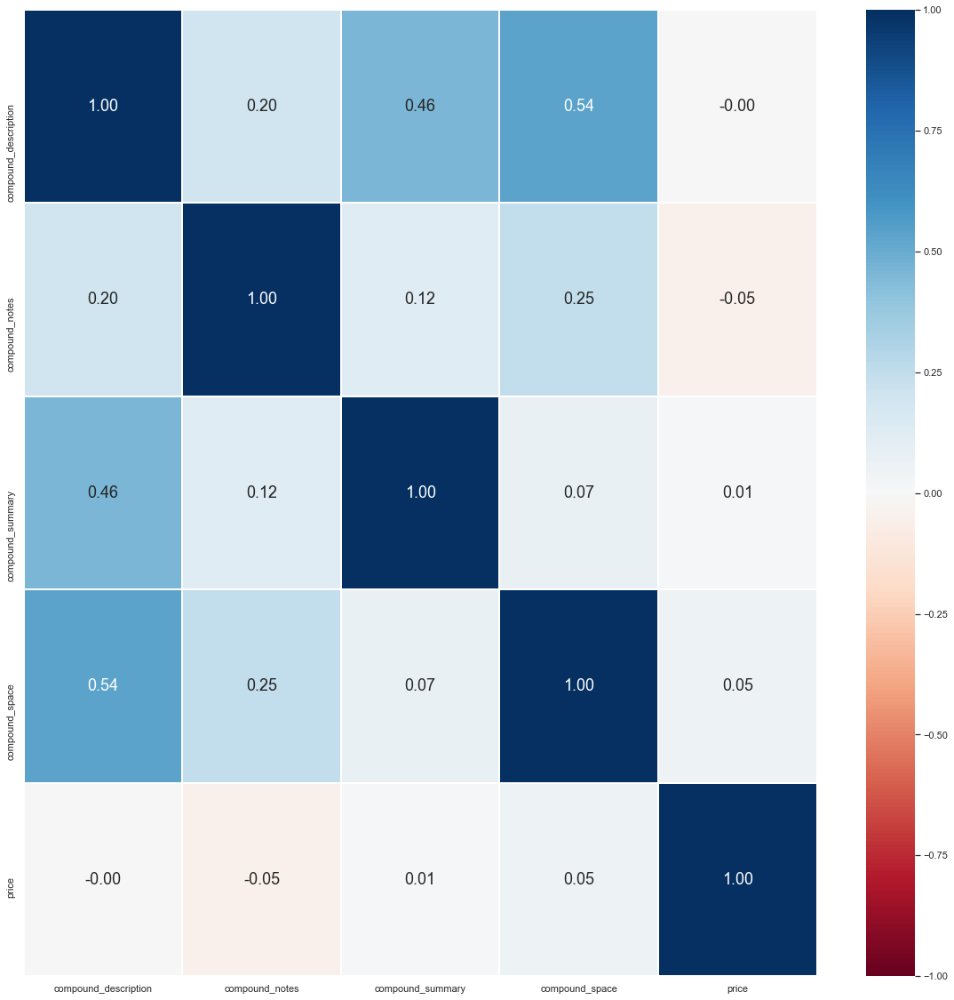

In [85]:
# Heatmap of the Correlation Matrix
f, axes = plt.subplots(1, 1, figsize=(20, 20))
sb.heatmap(total_compound.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

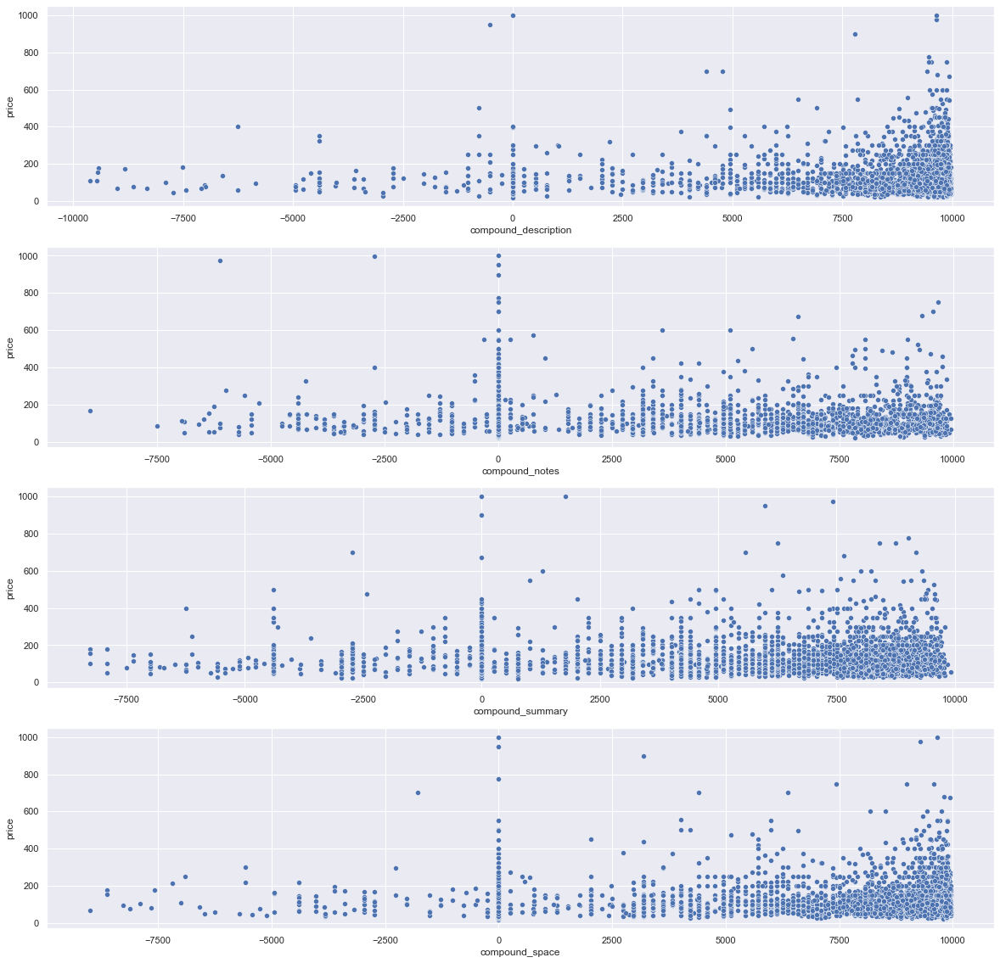

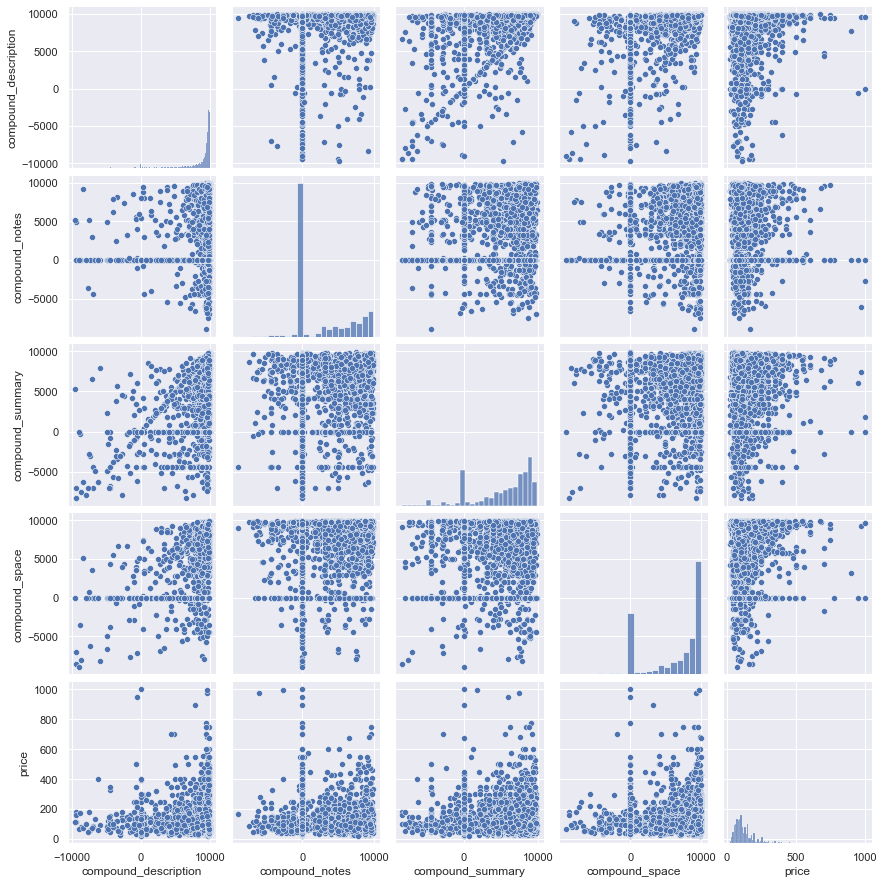

In [86]:
# Draw pairs of variables against one another
f, axes = plt.subplots(len(['compound_description', 'compound_notes', 'compound_summary', 'compound_space']), 1, figsize = (20, 20))
count_int = 0
for var in ['compound_description', 'compound_notes', 'compound_summary', 'compound_space']:
    sb.scatterplot(x = total_compound[var], 
                   y = total_compound['price'],
                   ax = axes[count_int])
    count_int += 1
    
# Pairplot
sb.pairplot(data = total_compound)

From the correlation matrix and pairplot we can predict that the four predictor variables used is not much significant in predicting the price as there is almost no relation with each other.

## Univariate Analysis

Train Set : (2863, 1) (2863, 1)
Test Set  : (955, 1) (955, 1)
Intercept 	: b =  [129.27730563]
Coefficients 	: a =  [[-0.00014188]]


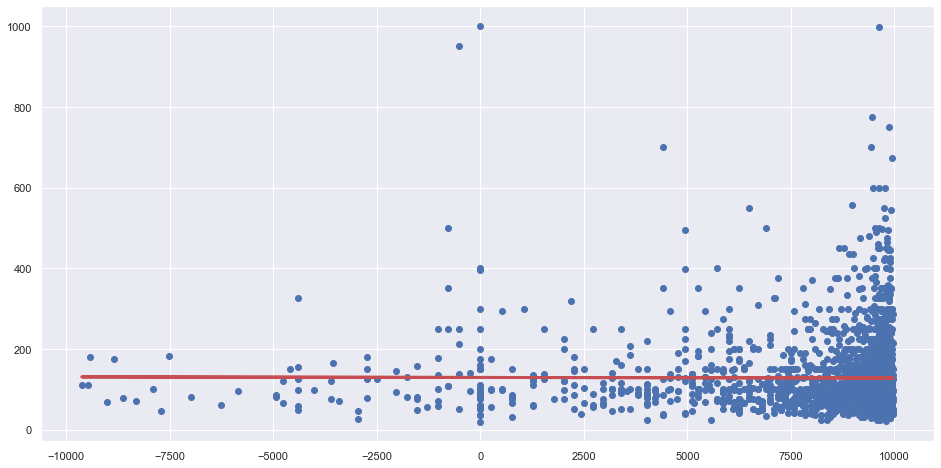

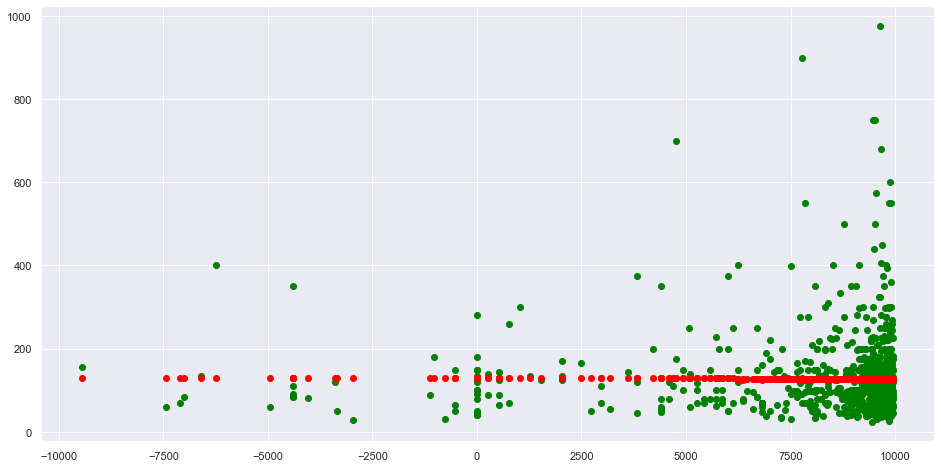

Explained Variance (R^2) for train 	: 1.75312833700092e-05
Explained Variance (R^2) for test 	: -1.6484881084632974e-06
Mean Squared Error for train 		: 7943.264453293042
Mean Squared Error for test 		: 8966.451918204877


In [101]:
# Univariate linear analysis of Compound description and Price
# Create a Linear Regression object
linreg = LinearRegression()

x = pd.DataFrame(total_compound['compound_description'])
y = pd.DataFrame(total_compound['price'])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", x_train.shape, y_train.shape)
print("Test Set  :", x_test.shape, y_test.shape)

linreg.fit(x_train, y_train)

print('Intercept \t: b = ', linreg.intercept_)   # Finding the intercept
print('Coefficients \t: a = ', linreg.coef_)     # Finding the coeffecients

# Formula for the Regression line
regline_x = x_train
regline_y = linreg.intercept_ + linreg.coef_ * x_train

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_train, y_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

# Predict Price values corresponding to Compound Summary
y_test_pred = linreg.predict(x_test)

# Plot the Predictions
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_test, y_test, color = "green")
plt.scatter(x_test, y_test_pred, color = "red")
plt.show()

# Predicting the Variance and MSE for both train and test set
print("Explained Variance (R^2) for train \t:", linreg.score(x_train, y_train))
print("Explained Variance (R^2) for test \t:", linreg.score(x_test, y_test))
print("Mean Squared Error for train \t\t:", mean_squared_error(y_train, y_train_pred))
print("Mean Squared Error for test \t\t:", mean_squared_error(y_test, y_test_pred))

Train Set : (2863, 1) (2863, 1)
Test Set  : (955, 1) (955, 1)
Intercept 	: b =  [131.71877942]
Coefficients 	: a =  [[-0.00129462]]


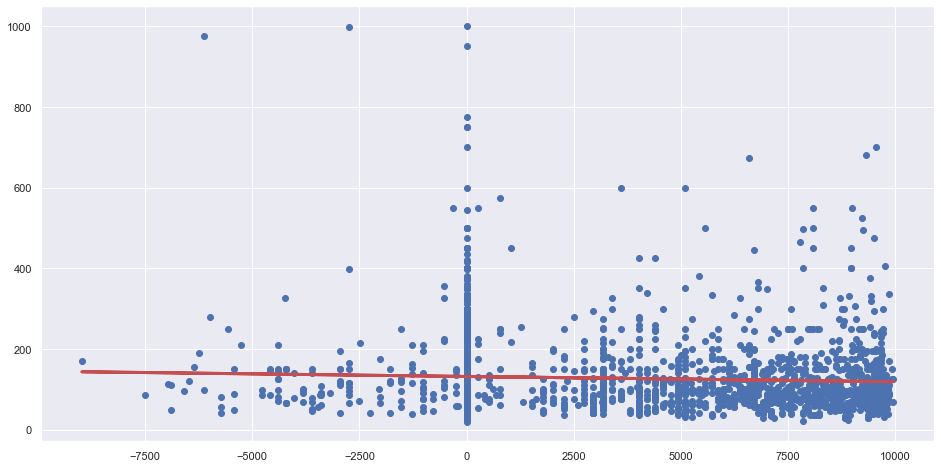

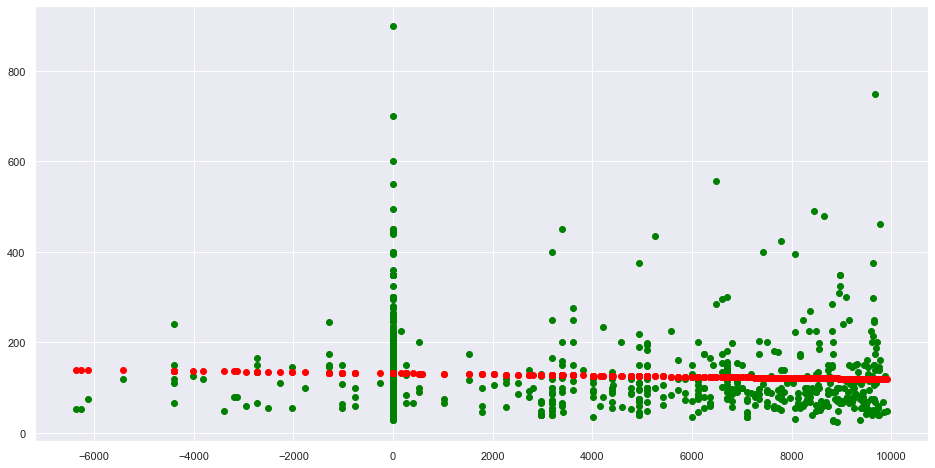

Explained Variance (R^2) for train 	: 0.003045249420196794
Explained Variance (R^2) for test 	: 0.0005811310174188566
Mean Squared Error for train 		: 8292.872342553566
Mean Squared Error for test 		: 7832.910885276579


In [100]:
# Uni variate linear regression for compound notes and price
# Create a Linear Regression object
linreg = LinearRegression()

x = pd.DataFrame(total_compound['compound_notes'])
y = pd.DataFrame(total_compound['price'])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", x_train.shape, y_train.shape)
print("Test Set  :", x_test.shape, y_test.shape)

linreg.fit(x_train, y_train)

print('Intercept \t: b = ', linreg.intercept_)  # Finding an intercept
print('Coefficients \t: a = ', linreg.coef_)    # Finding an coefficient

# Formula for the Regression line
regline_x = x_train
regline_y = linreg.intercept_ + linreg.coef_ * x_train

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_train, y_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

# Predict Price values corresponding to Compound Notes
y_test_pred = linreg.predict(x_test)

# Plot the Predictions
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_test, y_test, color = "green")
plt.scatter(x_test, y_test_pred, color = "red")
plt.show()

# Finding the Variance and MSE for train and test set
print("Explained Variance (R^2) for train \t:", linreg.score(x_train, y_train))
print("Explained Variance (R^2) for test \t:", linreg.score(x_test, y_test))
print("Mean Squared Error for train \t\t:", mean_squared_error(y_train, y_train_pred))
print("Mean Squared Error for test \t\t:", mean_squared_error(y_test, y_test_pred))

Train Set : (2863, 1) (2863, 1)
Test Set  : (955, 1) (955, 1)
Intercept 	: b =  [124.36044226]
Coefficients 	: a =  [[0.0004586]]


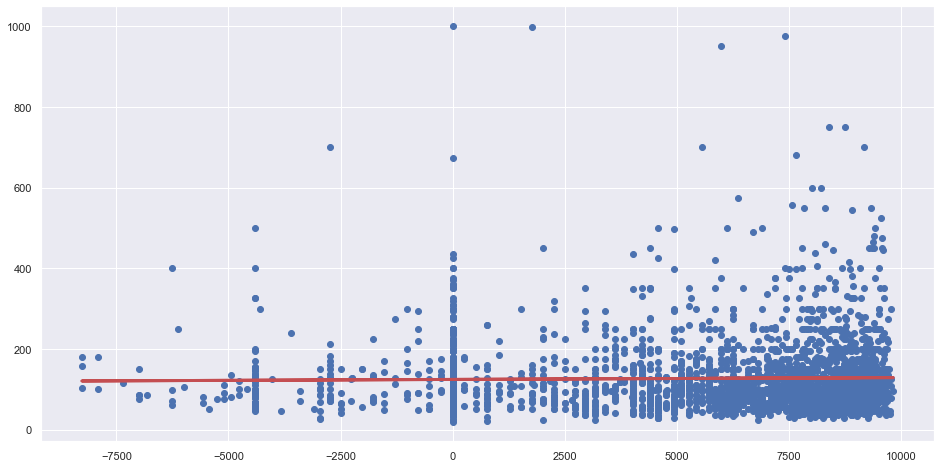

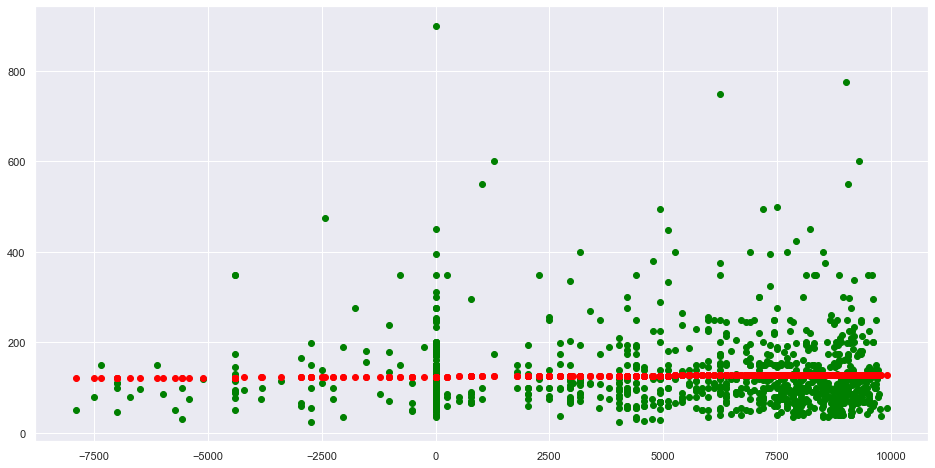

Explained Variance (R^2) for train 	: 0.00036878194833900313
Explained Variance (R^2) for test 	: -0.003535676913682728
Mean Squared Error for train 		: 8206.472375223677
Mean Squared Error for test 		: 8194.914916352669


In [99]:
# Uni variate linear regression for compound summary and price
# Create a Linear Regression object
linreg = LinearRegression()

x = pd.DataFrame(total_compound['compound_summary'])
y = pd.DataFrame(total_compound['price'])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", x_train.shape, y_train.shape)
print("Test Set  :", x_test.shape, y_test.shape)

linreg.fit(x_train, y_train)

print('Intercept \t: b = ', linreg.intercept_)   # Finding an intercept
print('Coefficients \t: a = ', linreg.coef_)     # Finding an coefficients

# Formula for the Regression line
regline_x = x_train
regline_y = linreg.intercept_ + linreg.coef_ * x_train

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_train, y_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

# Predict Price values corresponding to Compound summary
y_test_pred = linreg.predict(x_test)

# Plot the Predictions
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_test, y_test, color = "green")
plt.scatter(x_test, y_test_pred, color = "red")
plt.show()

# Finding the variance and MSE for train and test set.
print("Explained Variance (R^2) for train \t:", linreg.score(x_train, y_train))
print("Explained Variance (R^2) for test \t:", linreg.score(x_test, y_test))
print("Mean Squared Error for train \t\t:", mean_squared_error(y_train, y_train_pred))
print("Mean Squared Error for test \t\t:", mean_squared_error(y_test, y_test_pred))

Train Set : (2863, 1) (2863, 1)
Test Set  : (955, 1) (955, 1)
Intercept 	: b =  [122.24120592]
Coefficients 	: a =  [[0.0010258]]


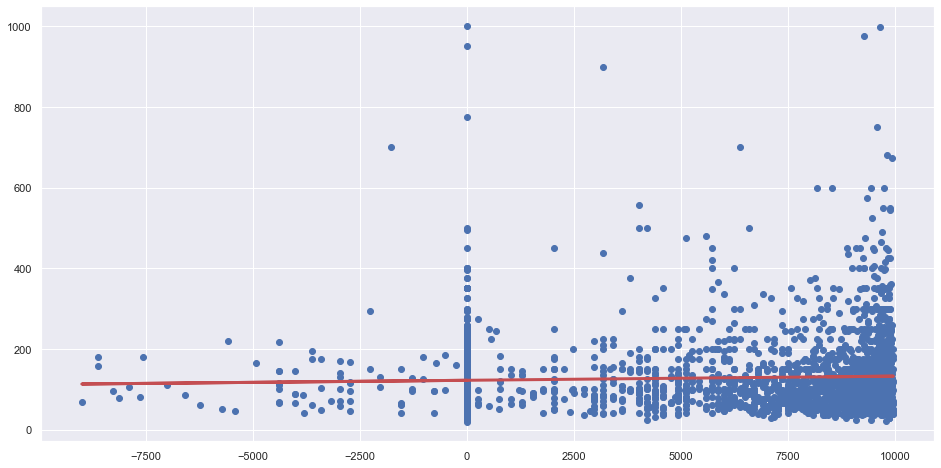

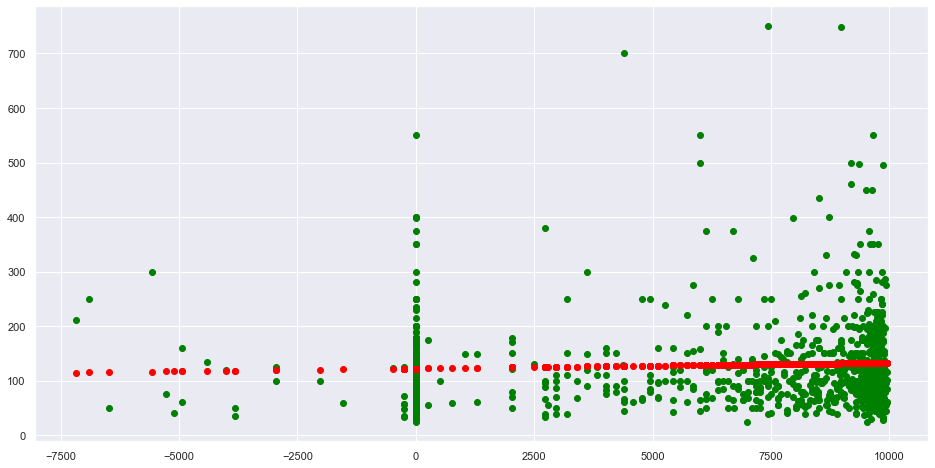

Explained Variance (R^2) for train 	: 0.0020740838285883134
Explained Variance (R^2) for test 	: 0.004479209841354859
Mean Squared Error for train 		: 8533.479707862769
Mean Squared Error for test 		: 7095.805216612063


In [98]:
# Uni variate linear regression for compound space and price
# Create a Linear Regression object
linreg = LinearRegression()

x = pd.DataFrame(total_compound['compound_space'])
y = pd.DataFrame(total_compound['price'])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", x_train.shape, y_train.shape)
print("Test Set  :", x_test.shape, y_test.shape)

linreg.fit(x_train, y_train)

print('Intercept \t: b = ', linreg.intercept_)  
print('Coefficients \t: a = ', linreg.coef_)

# Formula for the Regression line
regline_x = x_train
regline_y = linreg.intercept_ + linreg.coef_ * x_train

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_train, y_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

# Predict Price values corresponding to Compound space
y_test_pred = linreg.predict(x_test)

# Plot the Predictions
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(x_test, y_test, color = "green")
plt.scatter(x_test, y_test_pred, color = "red")
plt.show()

# Finding the variance and MSE for train and test set.
print("Explained Variance (R^2) for train \t:", linreg.score(x_train, y_train))
print("Explained Variance (R^2) for test \t:", linreg.score(x_test, y_test))
print("Mean Squared Error for train \t\t:", mean_squared_error(y_train, y_train_pred))
print("Mean Squared Error for test \t\t:", mean_squared_error(y_test, y_test_pred))

## MultiVariate Analysis

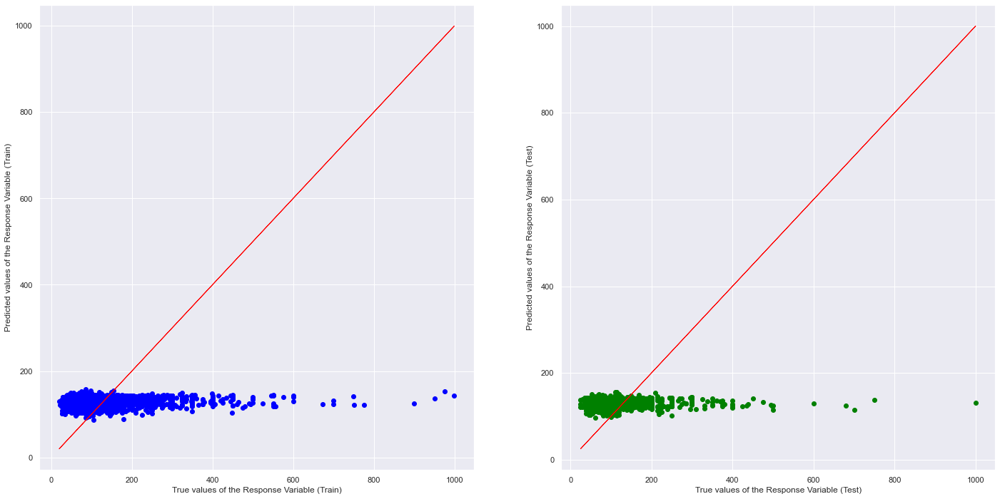

Explained Variance (R^2) for train 	: 0.011747021866082563
Explained Variance (R^2) for test 	: -0.0024812842630774767
Mean Squared Error for train 		: 8177.809198473496
Mean Squared Error for test 		: 7755.144769209481


In [102]:
# Multivariate analysis using linear regression
x = pd.DataFrame(total_compound[['compound_description', 'compound_notes', 'compound_summary', 'compound_space']])
y = pd.DataFrame(total_compound['price'])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25)

# Create a Linear Regression object
linreg = LinearRegression()

# Train the Linear Regression model
linreg.fit(x_train, y_train)

# Predict Price values corresponding to 'compound_description', 'compound_notes', 'compound_summary', 'compound_space'
y_train_pred = linreg.predict(x_train)
y_test_pred = linreg.predict(x_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1 , color = 'red')
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1, color = 'red')
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Finding the variance and MSE for train and test set.
print("Explained Variance (R^2) for train \t:", linreg.score(x_train, y_train))
print("Explained Variance (R^2) for test \t:", linreg.score(x_test, y_test))
print("Mean Squared Error for train \t\t:", mean_squared_error(y_train, y_train_pred))
print("Mean Squared Error for test \t\t:", mean_squared_error(y_test, y_test_pred))

<ipython-input-105-e95a2dc60026>:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(x_train, y_train)


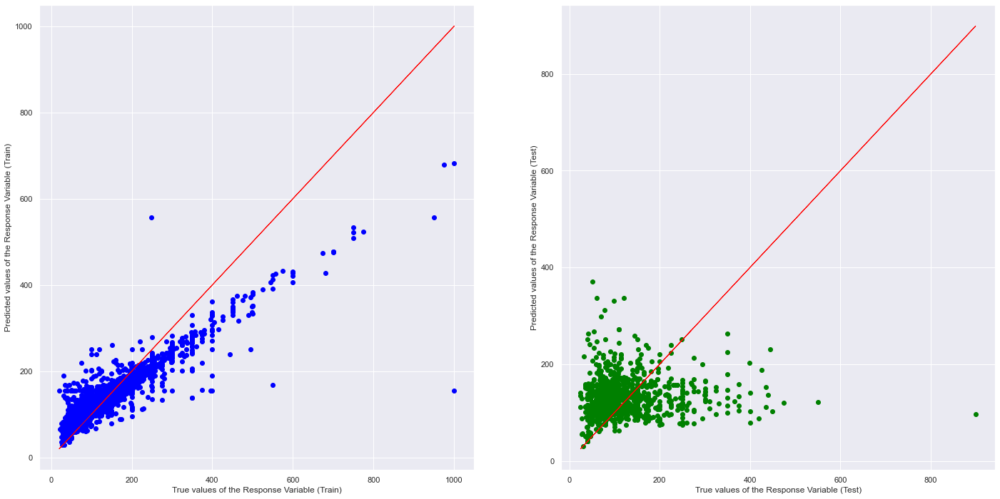

Explained Variance (R^2) for train 	: 0.7679732742199351
Explained Variance (R^2) for test 	: -0.21543365446171614
Mean Squared Error for train 		: 2036.0710868172425
Mean Squared Error for test 		: 7568.354919228382


In [105]:
# Multivariate analysis using Random Forest Regressor
x = pd.DataFrame(total_compound[['compound_description', 'compound_notes', 'compound_summary', 'compound_space']])
y = pd.DataFrame(total_compound['price'])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25)

# Create a Random Regression object
rf = RandomForestRegressor()

# Train the Random Regression model
rf.fit(x_train, y_train)

# Predict Price values corresponding to 'compound_description', 'compound_notes', 'compound_summary', 'compound_space'
y_train_pred = rf.predict(x_train)
y_test_pred = rf.predict(x_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1, color = 'red')
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1 , color = 'red')
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Finding the variance and MSE for train and test set.
print("Explained Variance (R^2) for train \t:", rf.score(x_train, y_train))
print("Explained Variance (R^2) for test \t:", rf.score(x_test, y_test))
print("Mean Squared Error for train \t\t:", mean_squared_error(y_train, y_train_pred))
print("Mean Squared Error for test \t\t:", mean_squared_error(y_test, y_test_pred))

C:\Users\Nishaanth\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


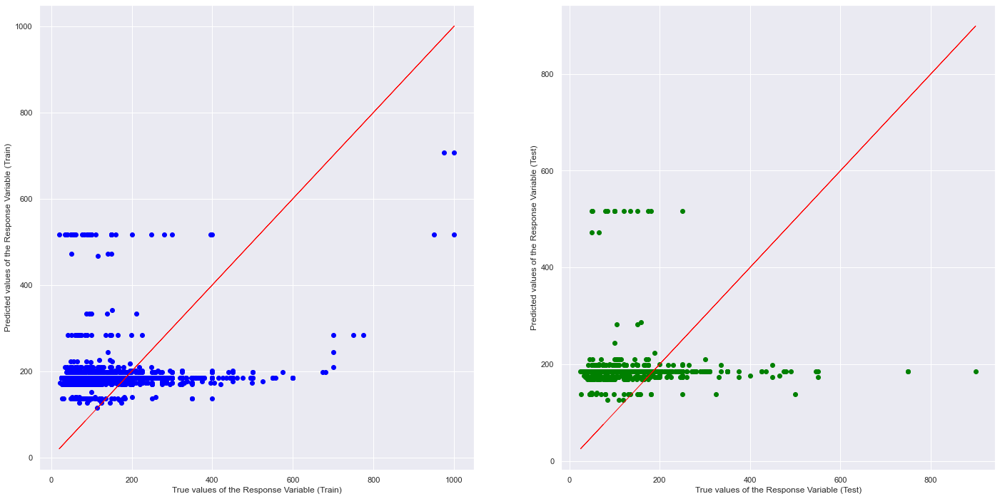

Explained Variance (R^2) for train 	: -0.5010852421263985
Explained Variance (R^2) for test 	: -0.7138561329599558
Mean Squared Error for train 		: 12505.28156147452
Mean Squared Error for test 		: 12989.88667404097


In [106]:
# Multivariate analysis using AdaBoost Regressor
x = pd.DataFrame(total_compound[['compound_description', 'compound_notes', 'compound_summary', 'compound_space']])
y = pd.DataFrame(total_compound['price'])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25)

# Create a Adaboost Regression object
model = AdaBoostRegressor()

# Train the Adaboost Regression model
model.fit(x_train, y_train)

# Predict Price values corresponding to 'compound_description', 'compound_notes', 'compound_summary', 'compound_space'
y_train_pred = model.predict(x_train)
y_test_pred = model.predict(x_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1, color = 'red')
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1 , color = 'red')
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Finding the variance and MSE for train and test set.
print("Explained Variance (R^2) for train \t:", model.score(x_train, y_train))
print("Explained Variance (R^2) for test \t:", model.score(x_test, y_test))
print("Mean Squared Error for train \t\t:", mean_squared_error(y_train, y_train_pred))
print("Mean Squared Error for test \t\t:", mean_squared_error(y_test, y_test_pred))

C:\Users\Nishaanth\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


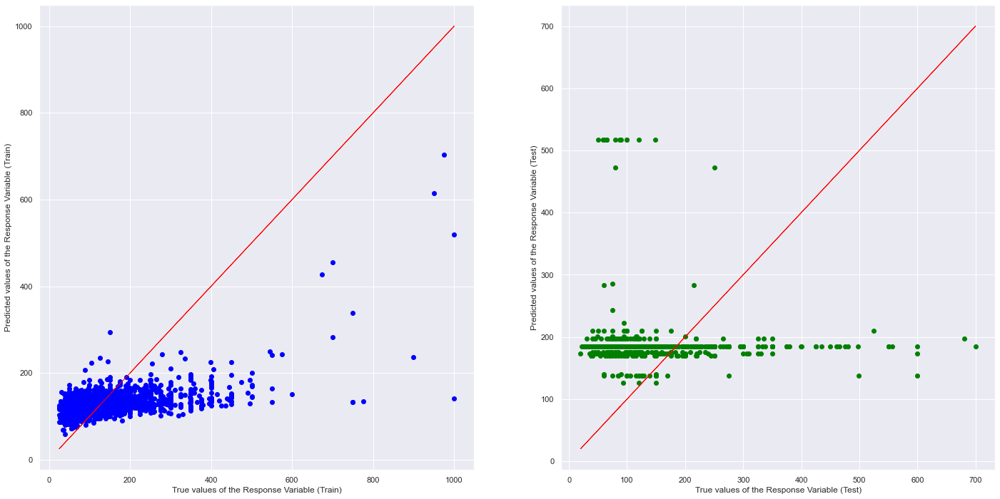

Explained Variance (R^2) for train 	: 0.2302538322872778
Explained Variance (R^2) for test 	: -0.004872674290173018
Mean Squared Error for train 		: 6347.030146828309
Mean Squared Error for test 		: 13670.42563627263


In [107]:
# Multivariate Analysis using Gradient Boosting Regressor
x = pd.DataFrame(total_compound[['compound_description', 'compound_notes', 'compound_summary', 'compound_space']])
y = pd.DataFrame(total_compound['price'])

# Split the Dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25)

# Create a Gradient Boosting Regression object
model = GradientBoostingRegressor()

# Train the Gradient Boosting Regression model
model.fit(x_train, y_train)

# Predict Price values corresponding to 'compound_description', 'compound_notes', 'compound_summary', 'compound_space'
y_train_pred = model.predict(x_train)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1, color = 'red')
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1 , color = 'red')
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Finding the variance and MSE for train and test set.
print("Explained Variance (R^2) for train \t:", model.score(x_train, y_train))
print("Explained Variance (R^2) for test \t:", model.score(x_test, y_test))
print("Mean Squared Error for train \t\t:", mean_squared_error(y_train, y_train_pred))
print("Mean Squared Error for test \t\t:", mean_squared_error(y_test, y_test_pred))

As we can see from the univariate and multivariate analysis the Explained variance is too low and the MSE is too high. Therefore we can't use sentiment of the predictore variables to find the price of the airbnb hotel.

## Problem 3b

Since the sentiment was not useful to predict the price, we changed our approach to predict the rating. Instead of using the sentiment we will use the predictor variables that we used in Problem 1 and 2 to predict whether the rating is high or not. 

For this problem we classified review_score_rating higher than 95 as a high rating others as lower rating. We tried to change the rating higher than 95 as True anything lower than that is False, so that we can solve this problem using Classification.

We did this so that we won't have another Regression Problem.

In [108]:
# Importing all the review ratings to a new dataframe
reviewscore = pd.DataFrame(listings['review_scores_rating'])
reviewscore.head()

,review_scores_rating
0,95.0
1,96.0
2,97.0
3,NaN
4,92.0


In [109]:
# To chnge the rating to a boolean value which we can later use in classification.
reviewscore['Is high rating'] = reviewscore['review_scores_rating'].apply(lambda x: True if x >= 95 else False)
reviewscore.head()

,review_scores_rating,Is high rating
0,95.0,True
1,96.0,True
2,97.0,True
3,NaN,False
4,92.0,False


In [110]:
# Adding rating to the existing dataframe
newairbnbdata['rating'] = reviewscore['Is high rating']
newairbnbdata.head()

,neighbourhood,property_type,roomtype,bedtype,price,rating
0,84,11,3,5,85,True
1,84,11,3,5,150,True
2,84,13,3,5,975,True
3,84,11,3,5,100,False
4,84,13,3,5,450,False


In [111]:
# Basic information for the appended dataframe
newairbnbdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3817 entries, 0 to 3817
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   neighbourhood  3817 non-null   int64
 1   property_type  3817 non-null   int64
 2   roomtype       3817 non-null   int64
 3   bedtype        3817 non-null   int64
 4   price          3817 non-null   int16
 5   rating         3817 non-null   bool 
dtypes: bool(1), int16(1), int64(4)
memory usage: 289.3 KB


In [112]:
# Basic statiscal information for the appended dataframe
newairbnbdata.describe()

,neighbourhood,property_type,roomtype,bedtype,price
count,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000
mean,49.266964,11.942625,2.634792,4.901755,127.978255
std,21.034195,1.503876,0.541491,0.509901,90.261754
min,1.000000,1.000000,1.000000,1.000000,20.000000
25%,34.000000,11.000000,2.000000,5.000000,75.000000
50%,52.000000,12.000000,3.000000,5.000000,100.000000
75%,64.000000,13.000000,3.000000,5.000000,150.000000
max,87.000000,16.000000,3.000000,5.000000,1000.000000


## Exploratory Analysis 4

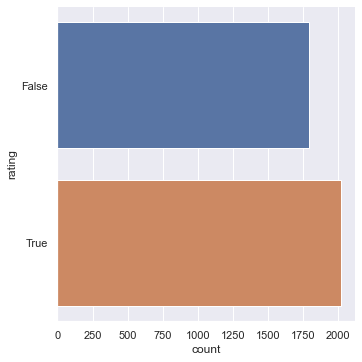

In [113]:
sb.catplot(y = 'rating', data = newairbnbdata, kind = "count")

In [114]:
newairbnbdata["rating"].value_counts(normalize=True)

True     0.529997
False    0.470003
Name: rating, dtype: float64

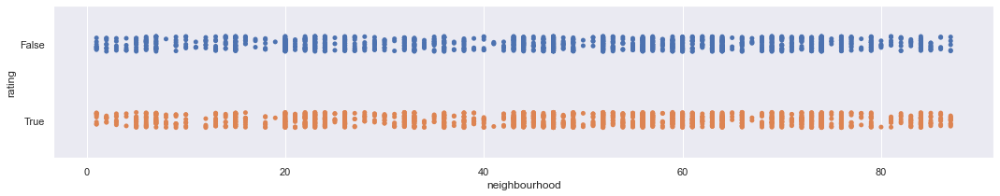

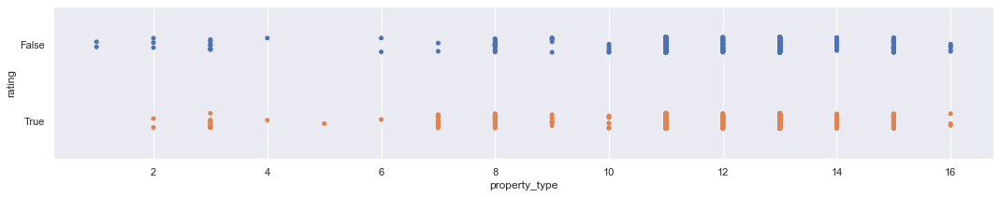

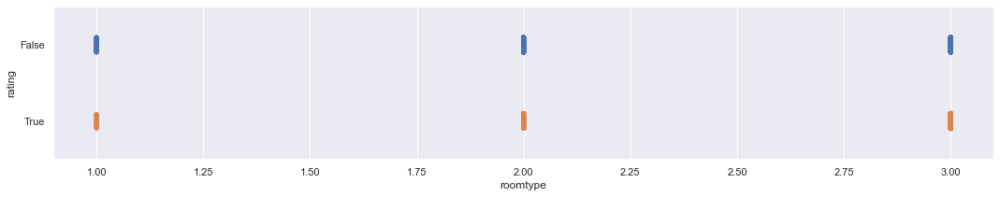

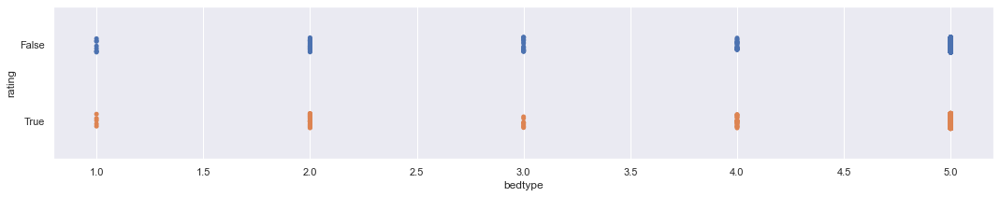

In [116]:
# Plotting stripplot
for var in ["neighbourhood", "property_type", "roomtype", "bedtype"]:
    f, axes = plt.subplots(1,1,figsize=(18,3))
    sb.stripplot(x = newairbnbdata[var],
                     y = 'rating',
                     orient= "h" ,
                     data = newairbnbdata)

## Decision Tree Analysis

In [117]:
# Importing data to a new dataframe so that it will be convenient when plotting the Decision tree
classificationdata = pd.DataFrame(newairbnbdata, columns = ['neighbourhood', 'property_type', 'roomtype', 'bedtype','rating'])
classificationdata.head()

,neighbourhood,property_type,roomtype,bedtype,rating
0,84,11,3,5,True
1,84,11,3,5,True
2,84,13,3,5,True
3,84,11,3,5,False
4,84,13,3,5,False


Predictor: 	 neighbourhood
Response: 	 rating
Goodness of Fit of Model Train Dataset
Classification Accuracy 	: 0.552898788077301
Goodness of Fit of Model Test Dataset
Classification Accuracy 	: 0.5209424083769634
True positive rate:	 0.8564593301435407
True negative rate:	 0.11560693641618497
False positive rate:	 0.8843930635838151
False negative rate:	 0.1435406698564593


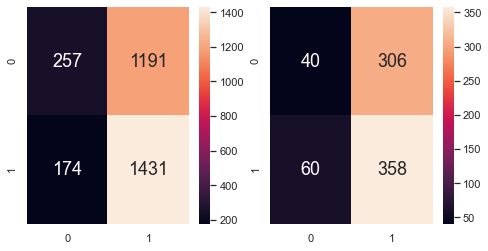

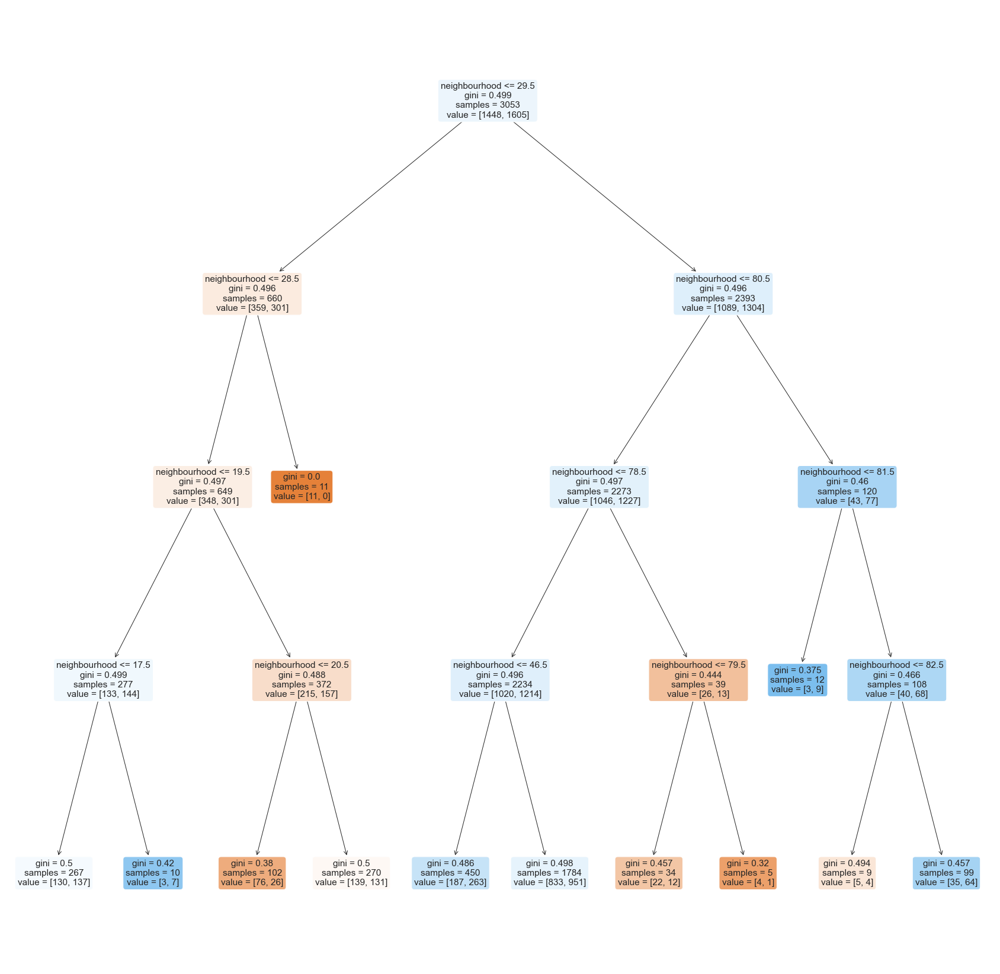

In [120]:
# Uni variate Decision tree analysis between rating and neighbourhood
y = pd.DataFrame(classificationdata['rating'])
X = pd.DataFrame(classificationdata['neighbourhood'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2) 

# Create a decision tree
dectree = DecisionTreeClassifier(max_depth = 4) 
    
# Train the decision tree
dectree.fit(X_train, y_train) 
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)
    
# Finding the goodness of the fit
print("Predictor: \t", str('neighbourhood'))
print("Response: \t", str('rating'))
print("Goodness of Fit of Model Train Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))

print("Goodness of Fit of Model Test Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))

# Calculating the values of confusion matrix
tpr = recall_score(y_test, y_test_pred)
tnr = recall_score(y_test, y_test_pred, pos_label = 0) 
fpr = 1 - tnr
fnr = 1 - tpr
    
# Printing the values of confusion matrix
print("True positive rate:\t", tpr)
print("True negative rate:\t", tnr)
print("False positive rate:\t", fpr)
print("False negative rate:\t", fnr)

# Plotting the confusion matrix
f, axes = plt.subplots(1, 2, figsize=(8, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plotting the tree
f, axes = plt.subplots(1, 1, figsize=(30, 30))  
plot_tree(dectree, filled=True, rounded = True, feature_names=X_train.columns)
plt.show()
    

Predictor: 	 property_type
Response: 	 rating
Goodness of Fit of Model Train Dataset
Classification Accuracy 	: 0.538159187684245
Goodness of Fit of Model Test Dataset
Classification Accuracy 	: 0.5091623036649214
True positive rate:	 0.9665809768637532
True negative rate:	 0.034666666666666665
False positive rate:	 0.9653333333333334
False negative rate:	 0.033419023136246784


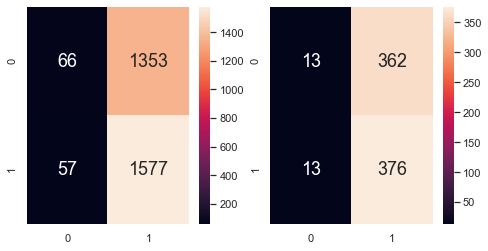

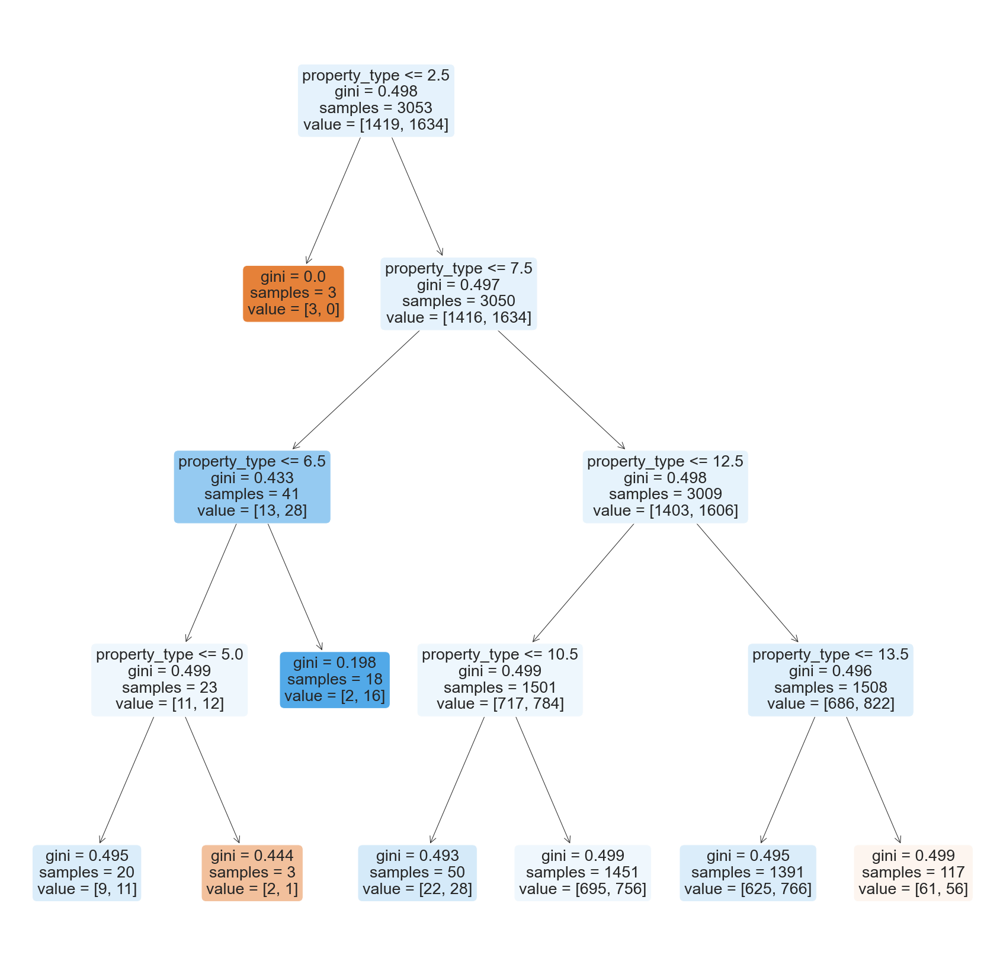

In [121]:
# Univariate decision tree between rating and property_type
y = pd.DataFrame(classificationdata['rating'])
X = pd.DataFrame(classificationdata['property_type'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2) 

# Create a decision tree
dectree = DecisionTreeClassifier(max_depth = 4)

# Train the decision tree
dectree.fit(X_train, y_train) 
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)
  
# Finding the goodness of the fit
print("Predictor: \t", str('property_type'))
print("Response: \t", str('rating'))
print("Goodness of Fit of Model Train Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))

print("Goodness of Fit of Model Test Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))

# Calculating the values of confusion matrix
tpr = recall_score(y_test, y_test_pred)
tnr = recall_score(y_test, y_test_pred, pos_label = 0) 
fpr = 1 - tnr
fnr = 1 - tpr
  
# Printing the values of confusion matrix
print("True positive rate:\t", tpr)
print("True negative rate:\t", tnr)
print("False positive rate:\t", fpr)
print("False negative rate:\t", fnr)

# Plotting the confusion matrix
f, axes = plt.subplots(1, 2, figsize=(8, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plotting the tree
f, axes = plt.subplots(1, 1, figsize=(30, 30))  
plot_tree(dectree, filled=True, rounded = True, feature_names=X_train.columns)
plt.show()
    

Predictor: 	 roomtype
Response: 	 rating
Goodness of Fit of Model Train Dataset
Classification Accuracy 	: 0.5397969210612512
Goodness of Fit of Model Test Dataset
Classification Accuracy 	: 0.5418848167539267
True positive rate:	 0.9754299754299754
True negative rate:	 0.047619047619047616
False positive rate:	 0.9523809523809523
False negative rate:	 0.02457002457002455


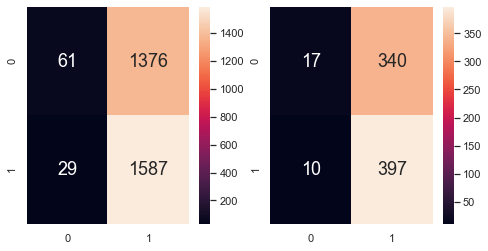

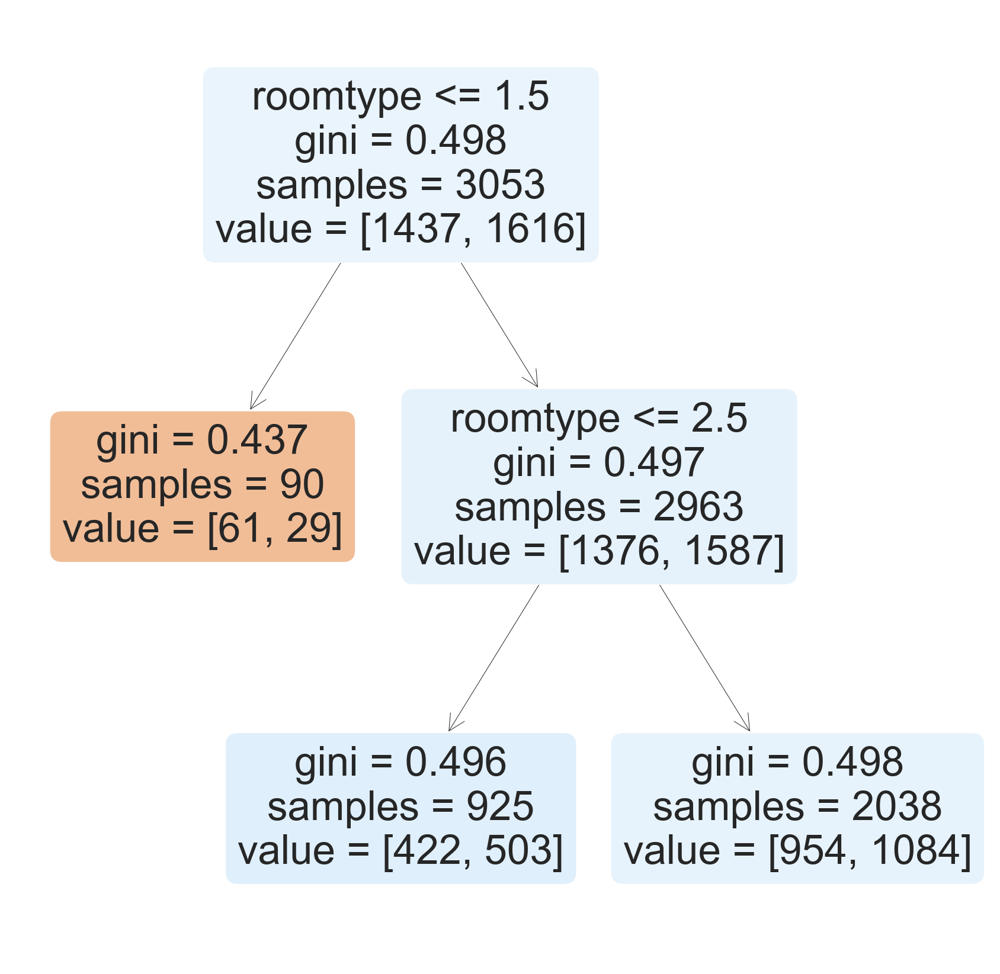

In [122]:
# Univariate decision tree between rating and roomtype
y = pd.DataFrame(classificationdata['rating'])
X = pd.DataFrame(classificationdata['roomtype'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2) 

# Create a decision tree
dectree = DecisionTreeClassifier(max_depth = 4) 

# Train the decision tree
dectree.fit(X_train, y_train) 
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)
    
# Finding the goodness of the fit
print("Predictor: \t", str('roomtype'))
print("Response: \t", str('rating'))
print("Goodness of Fit of Model Train Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))

print("Goodness of Fit of Model Test Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))

# Calculating the values of confusion matrix
tpr = recall_score(y_test, y_test_pred)
tnr = recall_score(y_test, y_test_pred, pos_label = 0) 
fpr = 1 - tnr
fnr = 1 - tpr
    
# Printing the values of confusion matrix
print("True positive rate:\t", tpr)
print("True negative rate:\t", tnr)
print("False positive rate:\t", fpr)
print("False negative rate:\t", fnr)

# Plotting the confusion matrix
f, axes = plt.subplots(1, 2, figsize=(8, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plotting the tree
f, axes = plt.subplots(1, 1, figsize=(30, 30))  
plot_tree(dectree, filled=True, rounded = True, feature_names=X_train.columns)
plt.show()
    

Predictor: 	 bedtype
Response: 	 rating
Goodness of Fit of Model Train Dataset
Classification Accuracy 	: 0.5404520144120537
Goodness of Fit of Model Test Dataset
Classification Accuracy 	: 0.4986910994764398
True positive rate:	 0.9712793733681462
True negative rate:	 0.023622047244094488
False positive rate:	 0.9763779527559056
False negative rate:	 0.02872062663185382


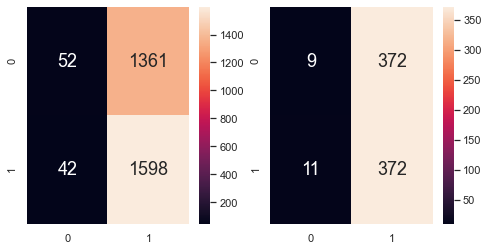

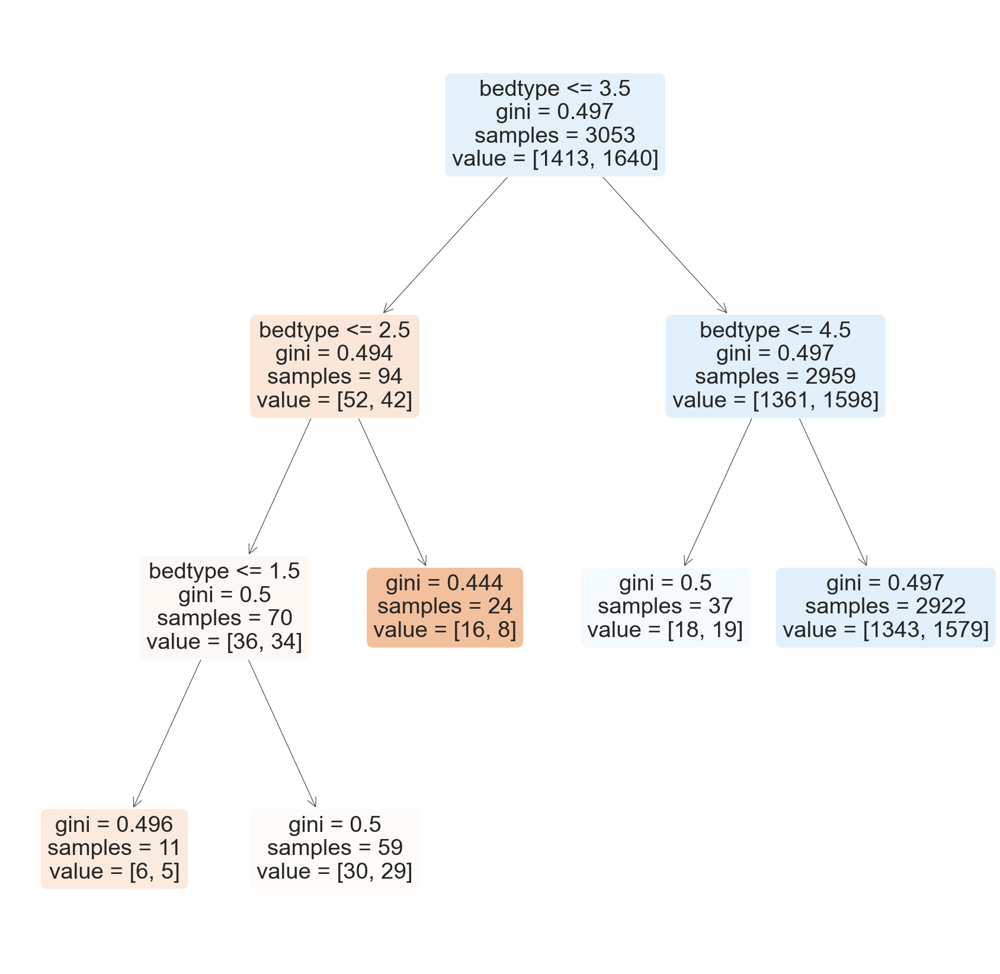

In [123]:
# Univariate decision tree between rating and bedtype
y = pd.DataFrame(classificationdata['rating'])
X = pd.DataFrame(classificationdata['bedtype'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

# Create a decision tree
dectree = DecisionTreeClassifier(max_depth = 4) 

# Train the decision tree
dectree.fit(X_train, y_train) 
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)
    
# Finding the goodness of the fit
print("Predictor: \t", str('bedtype'))
print("Response: \t", str('rating'))
print("Goodness of Fit of Model Train Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))

print("Goodness of Fit of Model Test Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))

# Calculating the values of confusion matrix
tpr = recall_score(y_test, y_test_pred)
tnr = recall_score(y_test, y_test_pred, pos_label = 0) 
fpr = 1 - tnr
fnr = 1 - tpr
 
# Printing the values of confusion matrix
print("True positive rate:\t", tpr)
print("True negative rate:\t", tnr)
print("False positive rate:\t", fpr)
print("False negative rate:\t", fnr)

# Plotting the confusion matrix
f, axes = plt.subplots(1, 2, figsize=(8, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plotting the tree
f, axes = plt.subplots(1, 1, figsize=(30, 30))  
plot_tree(dectree, filled=True, rounded = True, feature_names=X_train.columns)
plt.show()
    

Predictor: 	 neighbourhood, property_type, roomtype, bedtype
Response: 	 rating 
Goodness of Fit of Model Train Dataset
Classification Accuracy 	: 0.5591221749099247
Goodness of Fit of Model Test Dataset
Classification Accuracy 	: 0.5327225130890052
True positive rate:	 0.9606299212598425
True negative rate:	 0.10704960835509138
False positive rate:	 0.8929503916449086
False negative rate:	 0.03937007874015752


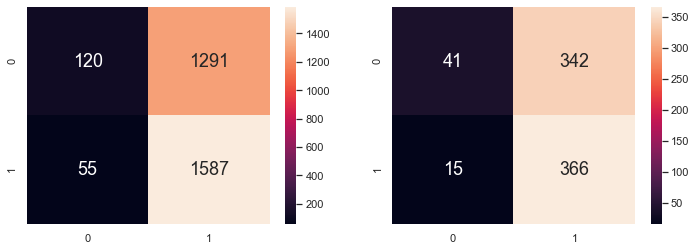

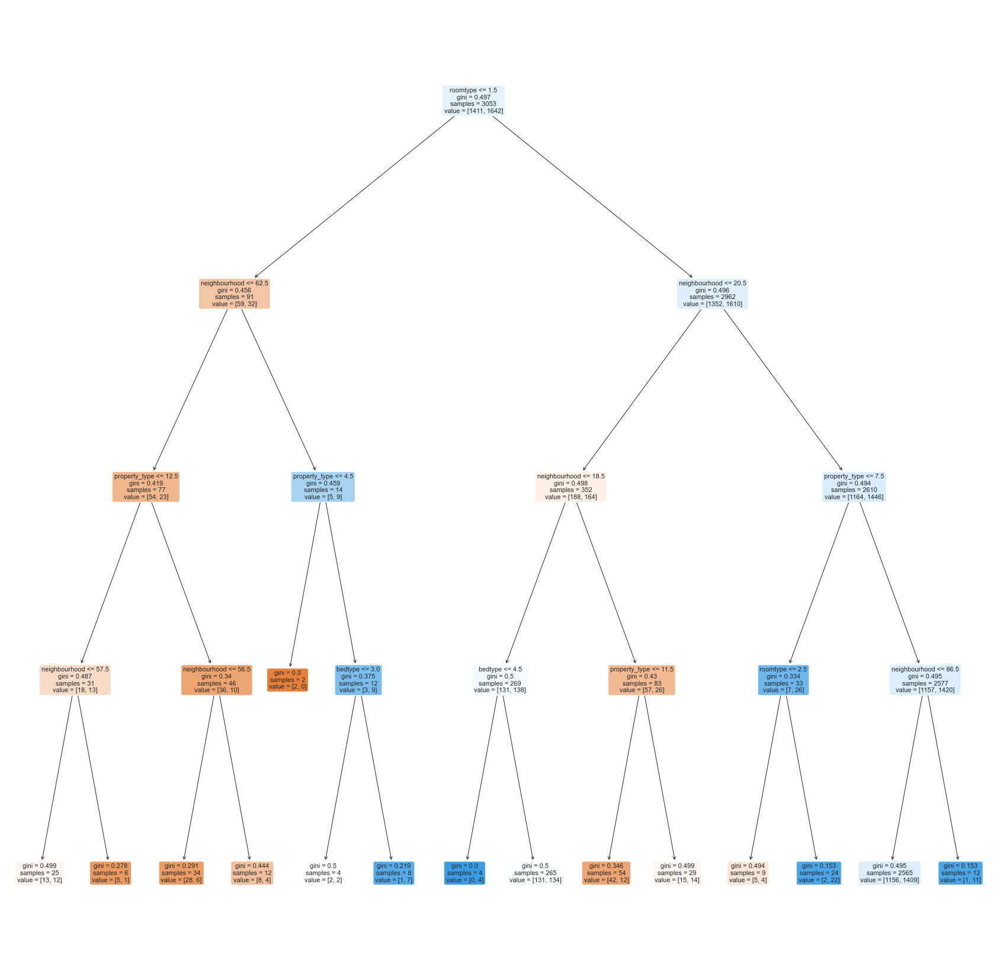

In [124]:
# Multivariate decision tree analysis using Decision Tree Classifier
y = pd.DataFrame(classificationdata["rating"])
X = pd.DataFrame(classificationdata[["neighbourhood", "property_type", "roomtype", "bedtype"]])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2) 

# Create a decision tree
dectree = DecisionTreeClassifier(max_depth = 4) 

# Train the decision tree
dectree.fit(X_train, y_train) 
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)
    
# Finding the goodness of the fit
print("Predictor: \t neighbourhood, property_type, roomtype, bedtype", )
print("Response: \t rating ", )
print("Goodness of Fit of Model Train Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))

print("Goodness of Fit of Model Test Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))

# Calculating the values of confusion matrix
tpr = recall_score(y_test, y_test_pred)
tnr = recall_score(y_test, y_test_pred, pos_label = 0) 
fpr = 1 - tnr
fnr = 1 - tpr
 
# Printing the values of confusion matrix
print("True positive rate:\t", tpr)
print("True negative rate:\t", tnr)
print("False positive rate:\t", fpr)
print("False negative rate:\t", fnr)

# Plotting the confusion matrix
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plotting the tree
f, axes = plt.subplots(1, 1, figsize=(30, 30))  
plot_tree(dectree, filled=True, rounded = True, feature_names=X_train.columns)
plt.show()

<ipython-input-125-0c73a0617dc7>:10: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


Predictor: 	 neighbourhood, property_type, roomtype, bedtype
Response: 	 rating 
Goodness of Fit of Model Train Dataset
Classification Accuracy 	: 0.5748444153291844
Goodness of Fit of Model Test Dataset
Classification Accuracy 	: 0.5196335078534031
True positive rate:	 0.890625
True negative rate:	 0.14473684210526316
False positive rate:	 0.8552631578947368
False negative rate:	 0.109375


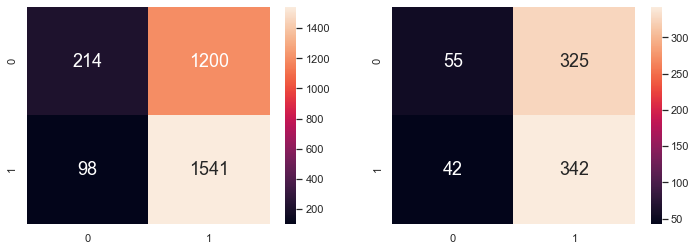

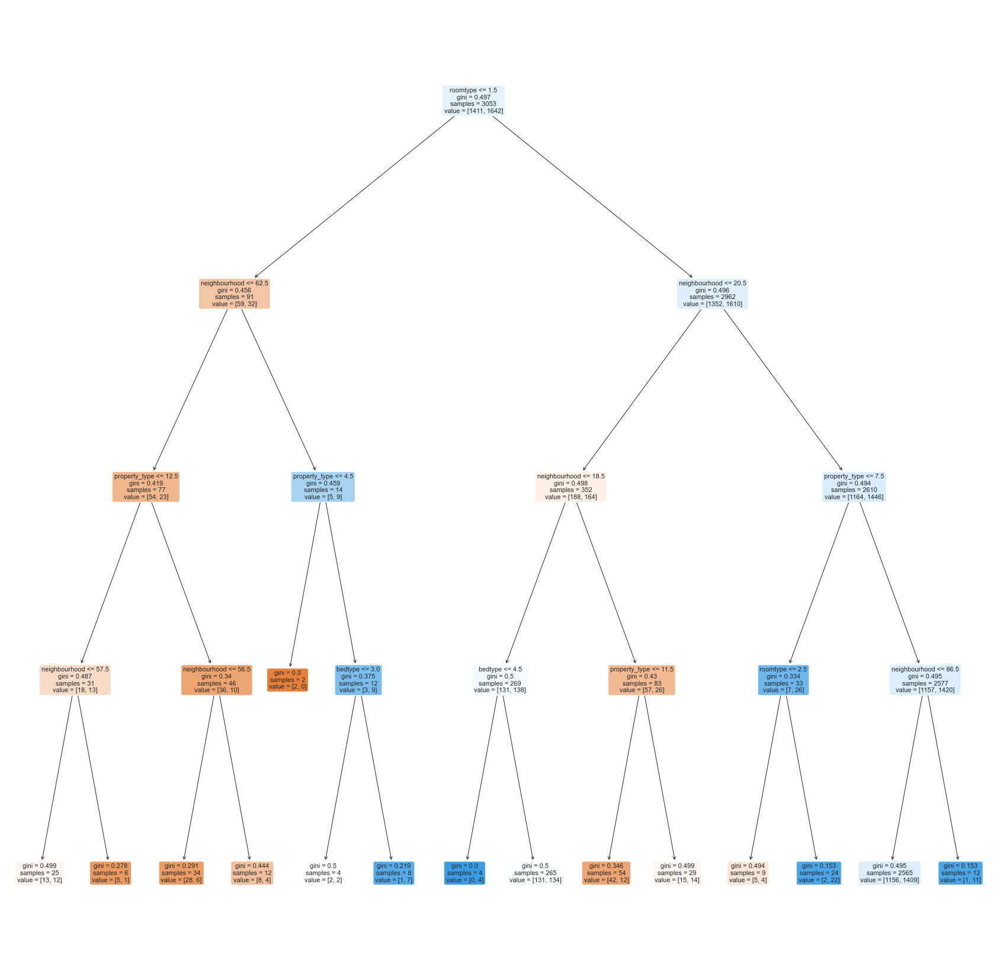

In [125]:
# Multivariate decision tree analysis using Random Forest Classifier
y = pd.DataFrame(classificationdata["rating"])
X = pd.DataFrame(classificationdata[["neighbourhood", "property_type", "roomtype", "bedtype"]])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2) 

# Create a decision tree
model = RandomForestClassifier(max_depth = 4)

# Train the decision tree
model.fit(X_train, y_train) 
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)
    
# Finding the goodness of the fit
print("Predictor: \t neighbourhood, property_type, roomtype, bedtype", )
print("Response: \t rating ", )
print("Goodness of Fit of Model Train Dataset")
print("Classification Accuracy \t:", model.score(X_train, y_train))

print("Goodness of Fit of Model Test Dataset")
print("Classification Accuracy \t:", model.score(X_test, y_test))

# Calculating the values of confusion matrix
tpr = recall_score(y_test, y_test_pred)
tnr = recall_score(y_test, y_test_pred, pos_label = 0) 
fpr = 1 - tnr
fnr = 1 - tpr
    
# Printing the values of confusion matrix
print("True positive rate:\t", tpr)
print("True negative rate:\t", tnr)
print("False positive rate:\t", fpr)
print("False negative rate:\t", fnr)

# Plotting the confusion matrix
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plotting the tree
f, axes = plt.subplots(1, 1, figsize=(30, 30))  
plot_tree(dectree, filled=True, rounded = True, feature_names=X_train.columns)
plt.show()

C:\Users\Nishaanth\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


Predictor: 	 neighbourhood, property_type, roomtype, bedtype
Response: 	 rating 
Goodness of Fit of Model Train Dataset
Classification Accuracy 	: 0.5640353750409434
Goodness of Fit of Model Test Dataset
Classification Accuracy 	: 0.5431937172774869
True positive rate:	 0.7389162561576355
True negative rate:	 0.32122905027932963
False positive rate:	 0.6787709497206704
False negative rate:	 0.26108374384236455


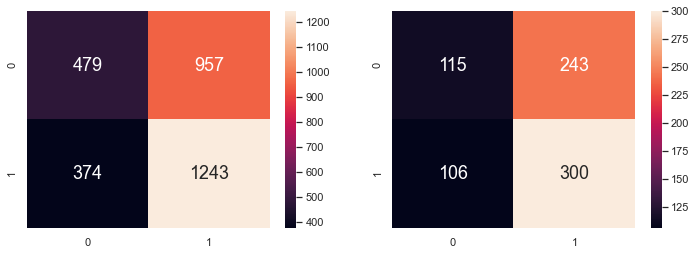

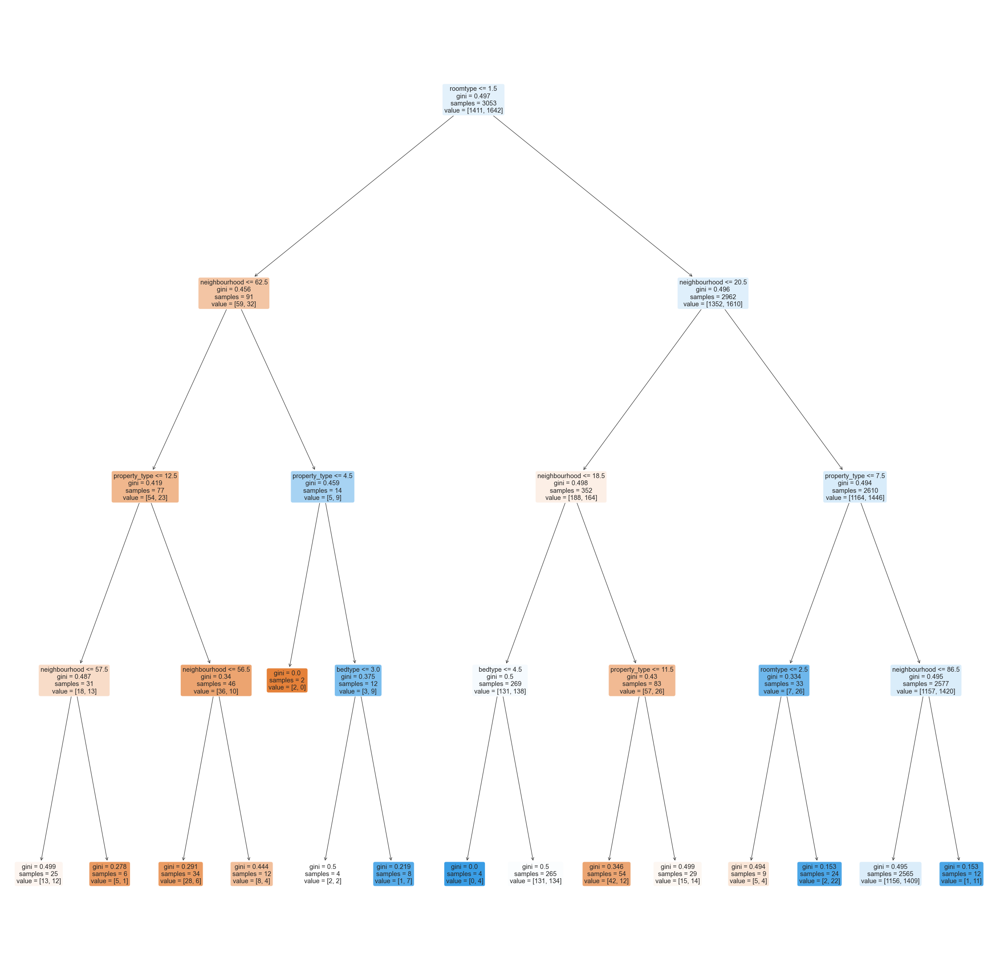

In [126]:
# Multivariate decision tree analysis using Ada Boost Classifier
y = pd.DataFrame(classificationdata["rating"])
X = pd.DataFrame(classificationdata[["neighbourhood", "property_type", "roomtype", "bedtype"]])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2) 

# Create a decision tree
model = AdaBoostClassifier() 

# Train the decision tree
model.fit(X_train, y_train) 
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)
    
# Finding the goodness of the fit
print("Predictor: \t neighbourhood, property_type, roomtype, bedtype", )
print("Response: \t rating ", )
print("Goodness of Fit of Model Train Dataset")
print("Classification Accuracy \t:", model.score(X_train, y_train))

print("Goodness of Fit of Model Test Dataset")
print("Classification Accuracy \t:", model.score(X_test, y_test))

# Calculating the values of confusion matrix
tpr = recall_score(y_test, y_test_pred)
tnr = recall_score(y_test, y_test_pred, pos_label = 0) 
fpr = 1 - tnr
fnr = 1 - tpr

# Printing the values of confusion matrix
print("True positive rate:\t", tpr)
print("True negative rate:\t", tnr)
print("False positive rate:\t", fpr)
print("False negative rate:\t", fnr)

# Plotting the confusion matrix
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plotting the tree
f, axes = plt.subplots(1, 1, figsize=(40, 40))  
plot_tree(dectree, filled=True, rounded = True, feature_names=X_train.columns)
plt.show()

C:\Users\Nishaanth\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


Predictor: 	 neighbourhood, property_type, roomtype, bedtype
Response: 	 rating 
Goodness of Fit of Model Train Dataset
Classification Accuracy 	: 0.6043236161152964
Goodness of Fit of Model Test Dataset
Classification Accuracy 	: 0.5353403141361257
True positive rate:	 0.805699481865285
True negative rate:	 0.25925925925925924
False positive rate:	 0.7407407407407407
False negative rate:	 0.19430051813471505


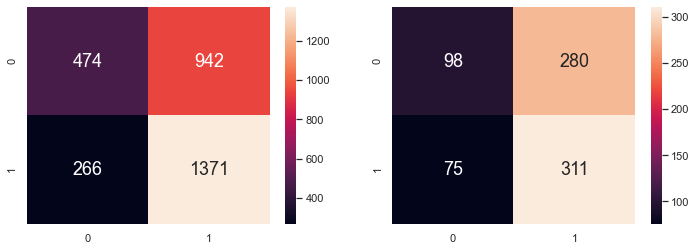

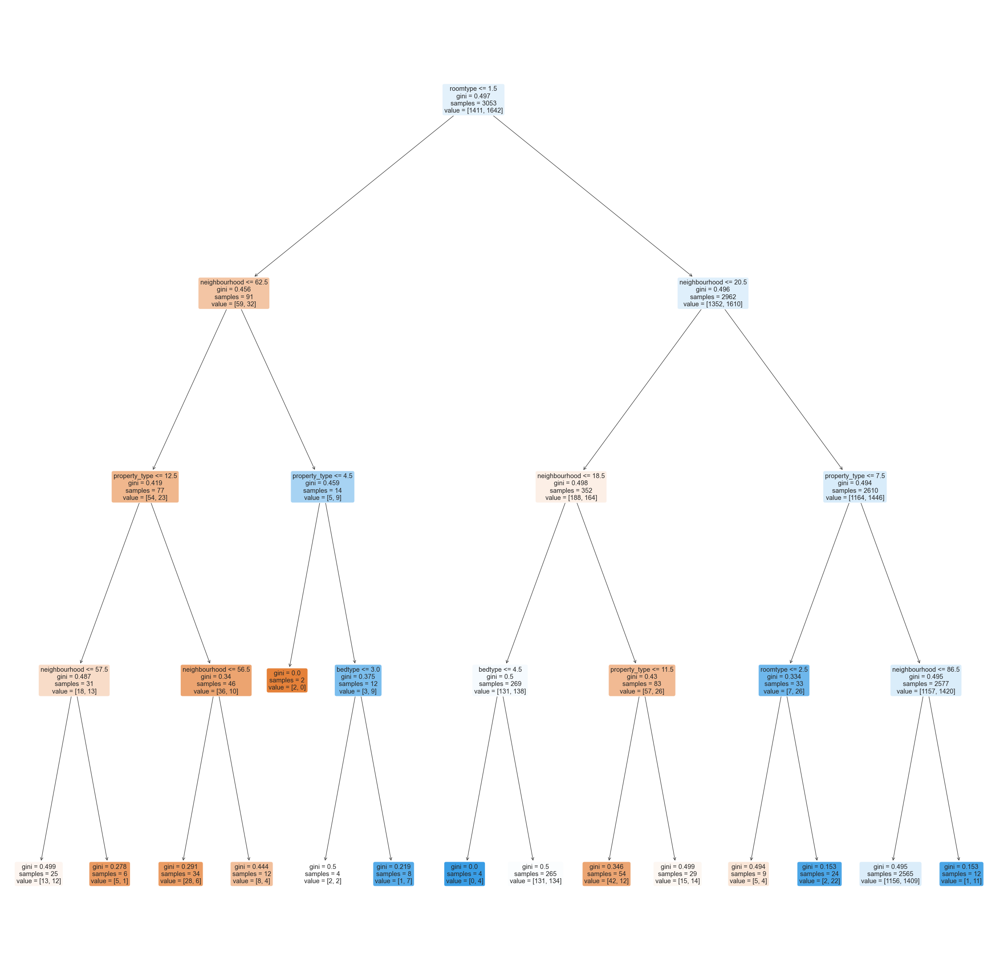

In [127]:
# Multivariate decision tree analysis using GradientBoosting Classifier
y = pd.DataFrame(classificationdata["rating"])
X = pd.DataFrame(classificationdata[["neighbourhood", "property_type", "roomtype", "bedtype"]])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2) 

# Create a decision tree
model = GradientBoostingClassifier() 

# Train the decision tree
model.fit(X_train, y_train) 
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)
    
# Finding the goodness of the fit
print("Predictor: \t neighbourhood, property_type, roomtype, bedtype", )
print("Response: \t rating ", )
print("Goodness of Fit of Model Train Dataset")
print("Classification Accuracy \t:", model.score(X_train, y_train))

print("Goodness of Fit of Model Test Dataset")
print("Classification Accuracy \t:", model.score(X_test, y_test))

# Calculating the values of confusion matrix
tpr = recall_score(y_test, y_test_pred)
tnr = recall_score(y_test, y_test_pred, pos_label = 0) 
fpr = 1 - tnr
fnr = 1 - tpr
    
# Printing the values of confusion matrix
print("True positive rate:\t", tpr)
print("True negative rate:\t", tnr)
print("False positive rate:\t", fpr)
print("False negative rate:\t", fnr)

# Plotting the confusion matrix
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plotting the tree
f, axes = plt.subplots(1, 1, figsize=(40, 40))  
plot_tree(dectree, filled=True, rounded = True, feature_names=X_train.columns)
plt.show()


From the Decision trees we acn predict that the Room type is the most important variable (highest priority) of all the given predictor variables to predict the rating

# Conclusion

- Of all the predictor variables ("neighbourhood", "property_type", "roomtype", "bedtype") that we considered Room type is the most significant to predict both price and rating.
- The considered variables ('description', 'notes', 'summary', 'space') for the sentimental analysis has no or very low relation to predict the price.

Done by:
- Sivakumar Nishaanth (U2021606L)
- Karthik Ramanathan (U2022855G)

# References
1. Kaggle
2. Stack Overflow